# Tutorial: HeFESTo - A fast tool for mineral fraction and properties profile

## Essentials
#### 1. What does HeFESTo do?

HeFESTo is a computational software of phase equilibria and physical properties of multi-
component assemblages relevant to the mantle of the Earth. The theory differs from previous
treatments in being thermodynamically self-consistent: the theory is based on the concept of
fundamental thermodynamic relations appropriately generalized to anisotropic strain and in
encompassing elasticity in addition to the usual isotropic thermodynamic properties.
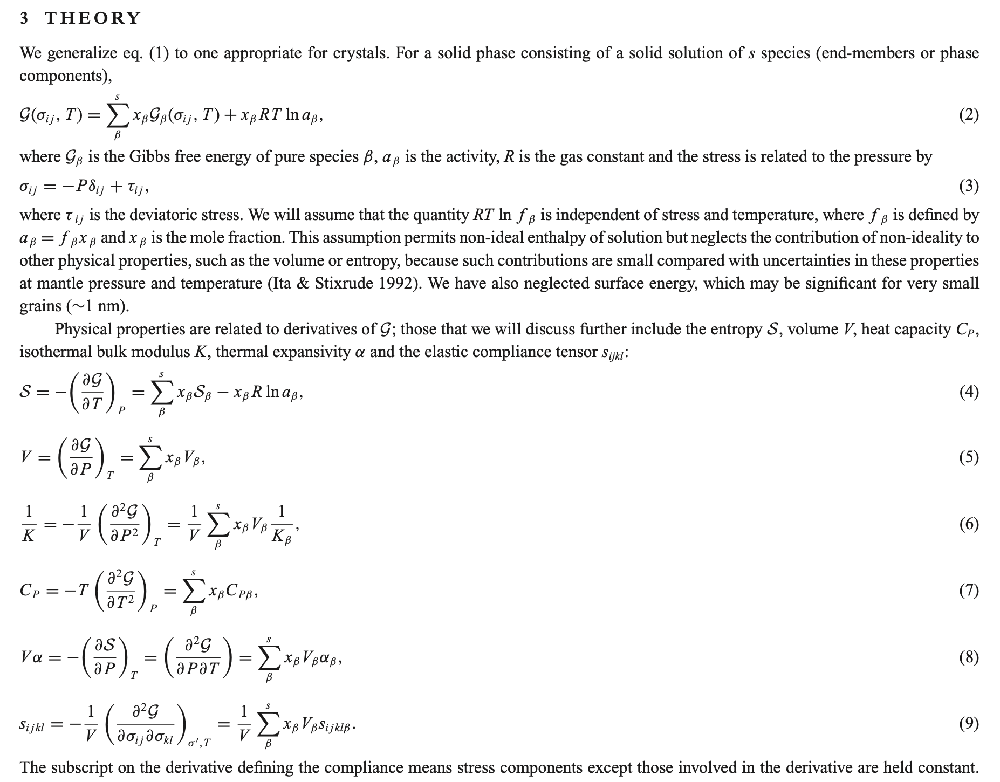

---

Package structure
```bash
.
├── example
├── HeFESToRepository # source code and executables (./HeFESToRepository/physub.f is the most important file that doing the global optimization)
│   └── BENCHMARK
├── H_Param # thermodynamic dataset
│   └── phase
└── Tools # self-developed post-processing tool for visuallization
```

---

Dataset structure
* phase
    ```bash
            an          ab          
        0.00000    13.00000 # interaction parameters
        0.00000     0.00000
    Volume
        0.00000     0.00000 # excess volume
        0.00000     0.00000

    ```
* species
    ```bash
            Na_1Al_1Si_3O_8   Albite                  
            13.00000        Atoms in formula unit                             
             4.00000        Z, Formula units in unit cell                     
           262.22300        Formula mass (g/mol)                              
           300.00000        T_0 (K)                                           
         -3717.90979        F_0 (kJ/mol)                                      
           100.45200        V_0 (cm^3/mol)                                    
            59.75259        K_0 (GPa)                                         
             2.77846        K_0 prime                                         
             0.00000        K_0K_0 prime prime (zero for third order)         
           719.08310        Theta_0 (K)                                       
             0.00000        Debye Acoustic Branch 2                           
             0.00000        Debye Acoustic Branch 3                           
             0.00000        Sin Acoustic Branch 1                             
             0.00000        Sin Acoustic Branch 2                             
             0.00000        Sin Acoustic Branch 3                             
             0.00000        Einstein Oscillator 1                             
             0.00000        Weight of Einstein Oscillator 1                   
             0.00000        Einstein Oscillator 2                             
             0.00000        Weight of Einstein Oscillator 2                   
             0.00000        Einstein Oscillator 3                             
             0.00000        Weight of Einstein Oscillator 3                   
             0.00000        Einstein Oscillator 4                             
             0.00000        Weight of Einstein Oscillator 4                   
             0.00000        Upper Limit of Optic Continuum                    
             0.00000        Lower Limit of Optic Continuum                    
             0.57877        gamma_0                                           
             1.00000        q_0                                               
             0.00000        beta (electronic contribution)                    
             0.00000        gammael_0 (electronic contribution)               
             0.00000        q_2A_2 (anharmonic contribution)                  
             0.00000        High Temperature Approximation (1=yes)            
             0.00000        Birch-Murnaghan (0) or Vinet (1)                  
             1.00000        Einstein (0) or Debye (1)                         
             0.00000        Zero Point Pressure (1=yes)                       
            36.00000        Ambient Shear Modulus                             
             1.38571        Pressure Derivative                               
             1.02954        Temperature Derivative                            
             0.00000        Critical Temperature (K)                          
             0.00000        Critical Entropy (J/mol/K)                        
             0.00000        Critical Volume (cm^3/mol)                        
             1.00000        Van Laar size parameter (-)                       
             2.00000        C12 prime                                         
             0.00000        C44 prime                                         

    ```
---

#### 2. Inputs and Outputs
- INPUTS
1. control file

    Structure of control file. 
    
    * Line 1. 
    
        First pressure (or density) (P1), last pressure (or density) (P2), number of 
        pressure intervals (nP), first temperature (or entropy) (T1), last temperature (or 
        entropy) (T2), number of temperature intervals (nT), ensemble flag (iensem), 
        super-adiabatic temperature (superad), frozen temperature (tfreeze). 
    
        Possible choices for the ensemble flag: 
        
        0: NPT ensemble.  This is the standard 

        1: read in a temperature profile from a file that must be called “ad.in” and which 
        must contain columns: Pressure, Unused, Temperature.  In this case, T1 and T2, 
        are ignored and nT=0. 

        2: NPS ensemble*.  In this case, T1 and T2 are entropies in units of J/g/K.   

        3: Hugoniot*.  The code computes the Hugoniot, with the unshocked state given 
        by the equilibrium assemblage at P1, T1.  T2 is ignored and nT=0. 

        4: NVT ensemble*.  In this case P1 and P2 are volumes in units of cm^3/g. 

        5: NVS ensemble*.  In this case T1 and T2 are entropies in units of J/g/K and P1 
        and P2 are volumes in units of cm^3/g. 

        6: Frozen equilibria*.  The equilibria computed at P1 and T1 are unchanged for 
        the remainder of the pressure, temperature calculations. 
        
    * Line 2.   
 
        number of components, c.  Further entries are not used. 
    
    * Line 3. 
    
        Specifies that all components are oxides.  Should not be changed. 
    
    - Lines 4 to 4+c-1.  
    
        Name of component, first amount of component, last amount of component, 
        number of intervals.  Note that the number of intervals should be the same for all 
        components. 
        
        Name of component is specified by the chemical symbol of the cation. 
        
        Amounts are specified in mole fraction of the oxide on a single cation basis (e.g. 
        SiO2, AlO1.5) 
        
    - Line 4+c 
    
        Level of theory (normally only for testing): ityp, ivtyp, ittyp, iltyp 

        Entries should be:  
        
        <u><b>1,1,1,2 (for 2011 parameter set version and earlier)</b> </u>

        <u><b>1,1,1,1 (for later parameter sets)</b></u>
    
        ityp .eq. 1: Volume dependence of VDOS:  full theory quadratic in theta 

        ityp .eq. 2: Volume dependence of VDOS:  Full theory linear in theta 

        ityp .eq. 3: Volume dependence of VDOS:  q=constant 

        ivtyp .eq. 1: Volume dependence of G: Full expansion 

        ivtyp .eq. 2: Volume dependence of G: Truncated expansion 

        ittyp .eq. 1: Temperature dependence of G: Full theory 

        ittyp .eq. 2: Temperature dependence of G: eta prop. V 

        ittyp .eq. 3: Temperature dependence of G: eta constant 

        ittyp .eq. 4: Temperature dependence of G: eta prop. Gq 

        iltyp .eq. 1: New Landau theory, post SLB11* 

        iltyp .eq. 2: Landau theory as in SLB11 
    
    * Line 4+c+1  
    
        Absolute path to the directory containing the parameter files 
    
    * Line 4+c+2  
    
        Number of end-member species 
    
    * Remaining lines 
    
        These specify the phases to be included; a code to indicate whether they are 
        present (1) or not (0) in the initial guess; and the names of the end-member 
        species to be included for that phase.  Note that the initial guess must span the 
        bulk composition.  Names of phases and species must match the names of the 
        corresponding parameter files. 
   
---

- OUTPUTS
    * fort.56 (Physical profiles)

        Structure of fort.56 
        
        Pressure (GPa), Depth (km), Temperature (K), Density (g/cm^3), Bulk sound 
        Velocity (km/s), Shear wave velocity (VS) (km/s), Longitudinal wave velocity (VP) 
        (km/s), VS modified by attenuation (km/s), VP modified by attenuation (km/s), 
        Enthalpy (kJ/g), Entropy (J/g/K), thermal expansivity (10-5 K-1), isobaric heat 
        capacity (J/g/K), isothermal bulk modulus (GPa), Shear attenuation (QS), 
        Longitudinal attenuation (QP), Quenched density (g/cm^3), most abundant 
        phase.  
        
        Note. The thermal expansivity, isobaric heat capacity, and isothermal bulk 
        modulus include metamorphic contributions*.  The wave velocities do not include 
        metamorphic contributions. 

     * Other properties (Phase proportion)

     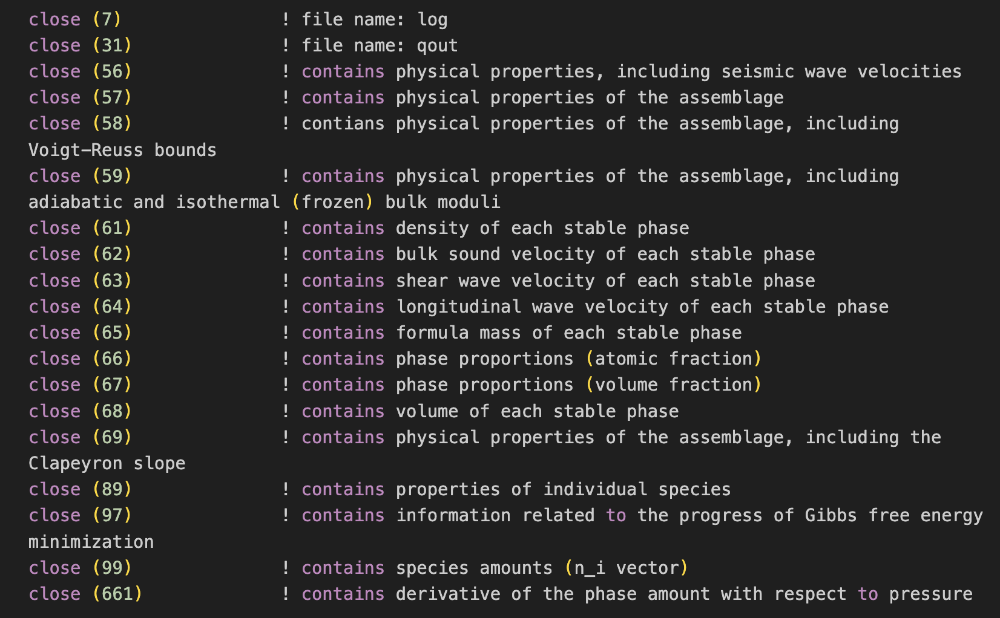
---

#### 3. Reference and Copyrights

(1) Stixrude, L. and C. Lithgow-Bertelloni, Thermodynamics of mantle minerals - III. The role of iron, Geophysical Journal International, in press, 2024.

If you also use HeFESTo, please cite the following for the source of the HeFESTo code:

(2) Stixrude, L. and C. Lithgow-Bertelloni, Thermodynamics of mantle minerals - I. Physical properties, Geophysical Journal International, 162, 610-632, 2005.

(3) Stixrude, L. and C. Lithgow-Bertelloni, Thermodynamics of mantle minerals - II. Phase equilibria, Geophysical Journal International, 184, 1180-1213, 2011.

The authors grant the right to download and use this data, but do not grant the right to redistribute modified versions of the data in any form. If you have questions about the data, suggestions for improvements, or would like to ask for additional permissions or data files, please contact the authors:

Lars Stixrude: lstixrude@epss.ucla.edu Carolina Lithgow-Bertelloni: clb@epss.ucla.edu

---


## Installation
#### Log in Della cluster to your working directory

``` bash
$ mkdir HeFESTo"
$ cd HeFESTo
$ git clone https://github.com/stixrude/HeFESToRepository.git
$ cp -r /scratch/gpfs/dz6898/software/HeFESToRepository/H_Paras_010123 .
$ echo "The parameter set is the latest version from Stixrude (2025)" > Readme.md
$ cp -f /projects/JIEDENG/Donghao/Group_Tutorial/HeFESTo/makefile HeFESToRepository
$ cd HeFESToRepository
$ make -j2
```


For future use of the updated parameter set, one can use the following command:
```bash
$ git clone https://github.com/stixrude/HeFESTo_Parameters_010123.git
$ mv HeFESTo_Parameters_010123 H_Param
```
#### Check if you get the excutable by the following command:

``` shell
$ ls | grep main
```
---

## Running the simulation

#### 1. Build the control file

Example: Mg/Si = 1.28
``` bash
0,140,14,2.5330109805002023,0,0,-2,0,0,0,0
8,2,4,2
oxides
Si           3.79222     3.79222    0
Mg           4.88475     4.88475    0
Fe           0.57874     0.57874    0
Ca           0.28734     0.28734    0
Al           0.39685     0.39685    0
Na           0.02197     0.02197    0
Cr           0.03813     0.03813    0
 O          14.00450    14.00450    0
1,1,1,1
/scratch/gpfs/dz6898/software/HeFESToRepository/H_Paras_010123
73
phase plg
0
an
ab
phase sp
1
sp
hc
smag
picr
phase opx
0
en
fs
mgts
odi
phase c2c
0
mgc2
fec2
phase cpx
1
di
he
cen
cats
jd
acm
phase wo
1
wo
phase pwo
1
pwo
phase gt
0
py
al
gr
mgmj
namj
andr
knor
phase cpv
0
capv
phase ol
1
fo
fa
phase wa
0
mgwa
fewa
phase ri
0
mgri
feri
phase il
0
mgil
feil
co
hem
esk
phase pv
0
mgpv
fepv
alpv
hepv
hlpv
fapv
crpv
phase ppv
0
mppv
fppv
appv
hppv
cppv
phase cf
0
mgcf
fecf
nacf
hmag
crcf
phase nal
0
mnal
fnal
nnal
phase mw
0
pe
wu
wuls
anao
mag
phase qtz
0
qtz
phase coes
0
coes
phase st
0
st
phase apbo
0
apbo
phase ky
0
ky
phase neph
0
neph
phase fea
0
fea
phase feg
0
feg
phase fee
0
fee

```


#### 2. Run thermodynamic model (Fast)

```bash
$ cd /path/to/your/control/file
$ sh ./H_run.sh
$ sed -i "s/mypath/yourpath/g" H_run.sh
```

Quick clean:

```bash
$ rm fort.*  GET_Fe.out  log   landau    qout
```

---


## Reference:

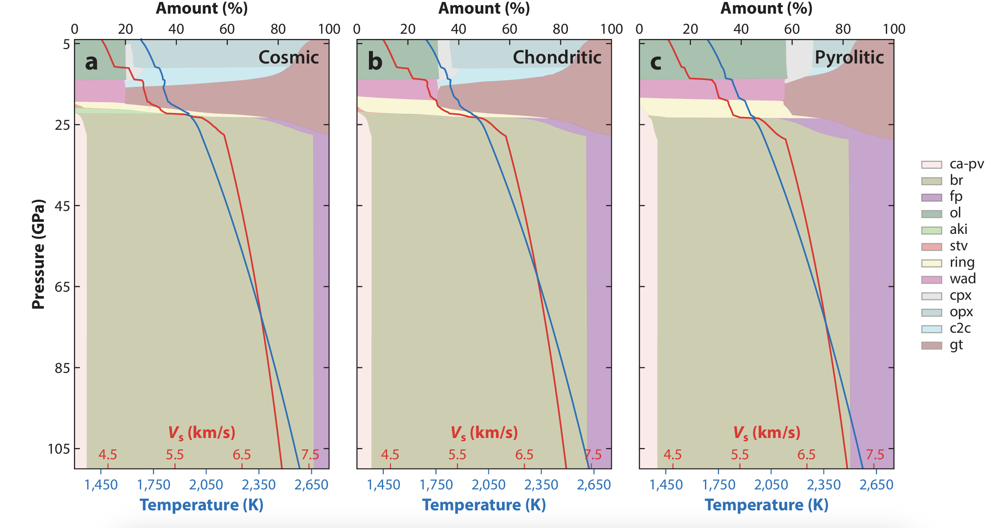
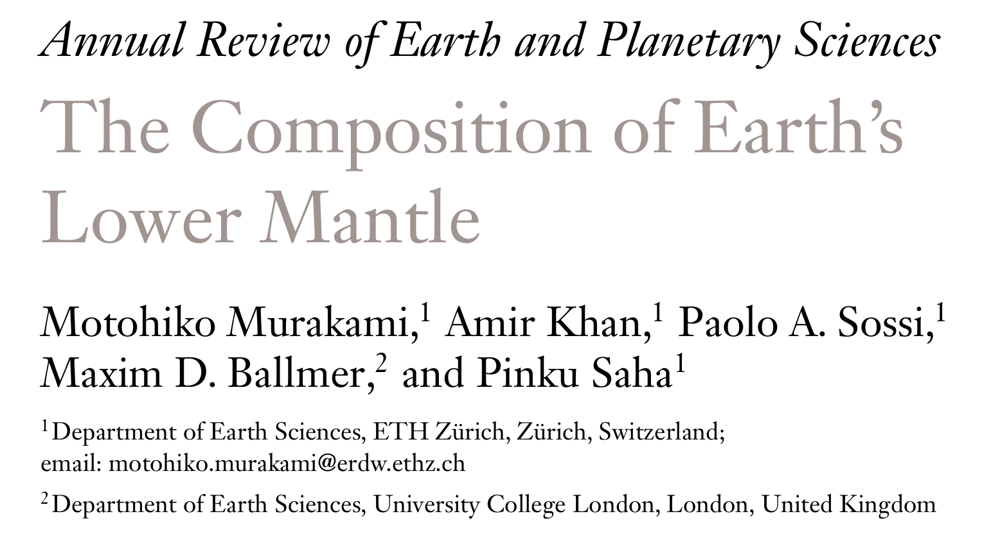

##  Real analysis

In [32]:
import re
import os
import sys
import colorsys
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.ticker import MaxNLocator
import pandas as pd
from matplotlib.ticker import AutoMinorLocator

plt.rcParams['font.size'] = 16
plt.rcParams['axes.titlesize'] = 16



# Absolute path to the HeFESTo directory of the datat: /projects/JIEDENG/Donghao/Group_Tutorial/HeFESTo

class Simulation:
    def __init__(self, name, title, dir):
        self.name = name
        self.title = title
        self.dir = dir
        self.profile_data = os.path.join(self.dir, 'fort.56')
        self.phase_density_data = os.path.join(self.dir, 'fort.61')
        self.atomicfraction_data = os.path.join(self.dir, 'fort.66')
        self.volfraction_data = os.path.join(self.dir, 'fort.67')
        self.all_output_data = os.path.join(self.dir, 'qout')
        self.phase_tables = {}        # {section_idx: DataFrame}
        self._build_tables()
        self.fraction = {}
        self.phase_cols = []
        
    def read_profile(self, save=False):
        """
        Read `fort.56`, skipping the banner line (skiprows=1),
        convert all numeric columns to float, apply unit factors,
        and keep only tidy, canonical names.
        """
        df = pd.read_csv(
            self.profile_data,
            delim_whitespace=True,
            skiprows=1,          # header actually starts on the 2nd physical line
            comment='#'          # just in case there are comment lines later
        )

        rename_map = {
            r'^P\(GPa\)$'          : ('P',      1.0),
            r'^depth.*\(km\)$'     : ('depth',  1.0),
            r'^T\(K\)$'            : ('T',      1.0),
            r'^rho\(g/cm\^3\)$'    : ('rho',    1.0),
            r'^VP\(km/s\)$'        : ('VP',     1.0),
            r'^VS\(km/s\)$'        : ('VS',     1.0),
            r'^VB\(km/s\)$'        : ('VB',     1.0),
            r'^VPQ\(km/s\)$'       : ('VPQ',    1.0),
            r'^VSQ\(km/s\)$'       : ('VSQ',    1.0),
            r'^H\(kJ/g\)$'         : ('H',      1.0),
            r'^S\(J/g/K\)$'        : ('S',      1.0),
            r'^alpha\(1e5_K\^-1\)$': ('alpha',  1.0),
            r'^cp\(J/g/K\)$'       : ('cp',     1.0),
            r'^KS\(GPa\)$'         : ('KS',     1.0),
            r'^Qs\(-\)$'           : ('Qs',     1.0),
            r'^Qp\(-\)$'           : ('Qp',     1.0),
            r'^rho_0\(g/cm\^3\)$'  : ('rho_0',  1.0),
        }

        original_cols = []
        for pattern, (new, factor) in rename_map.items():
            matches = df.filter(regex=pattern).columns
            if not len(matches):
                continue
            col = matches[0]

            # --- make sure values are numeric ---
            df[col] = pd.to_numeric(df[col], errors='coerce')

            # --- apply unit conversion ---
            df[new] = df[col] * factor
            original_cols.append(col)

        # Drop the verbose original columns we just converted
        df.drop(columns=original_cols, inplace=True)

        self.profile = df
        
        # Save the profile data to a CSV file
        if save:
            output_file = os.path.join('./Real_run_test/Output_data', 'profile_data'+self.name+'.csv')
            df.to_csv(output_file, index=False)
            print(f"Profile data saved to {output_file}")

    def read_phase_fraction(self,save=False, fraction_type='atomic'):
        if fraction_type == 'atomic':
            df = pd.read_csv(self.atomicfraction_data, delim_whitespace=True, comment='#')
        elif fraction_type == 'volume':
            df = pd.read_csv(self.volfraction_data, delim_whitespace=True, comment='#')

        # Identify P, depth, T by regex (handles Pi/pi, Ti/ti)
        P_col  = df.filter(regex=r'^P[iI]$').columns[0]
        z_col  = df.filter(regex=r'^depth$').columns[0]
        T_col  = df.filter(regex=r'^T[iI]$').columns[0]

        df['P']     = df[P_col]
        df['depth'] = df[z_col] 
        df['T']     = df[T_col]

        # Phase columns = everything after the first three
        core = {P_col, z_col, T_col}
        phase_cols = [c for c in df.columns if c not in core]

        # Make sure they are floats (they might come in as str)
        df[phase_cols] = df[phase_cols].apply(pd.to_numeric, errors='coerce')

        # Calculate dominant phase row-by-row
        df['dominant_phase'] = df[phase_cols].idxmax(axis=1)

        self.fraction = df[['depth'] + phase_cols]
        
        # Save the volume fraction data to a CSV file
        if save:
            output_file = os.path.join('./Real_run_test/Output_data', fraction_type+'fraction_data'+self.name+'.csv')
            df.to_csv(output_file, index=False)
            print(fraction_type + f" fraction data saved to {output_file}")
            
    def read_phase_density(self, save=False):
        """
        Read `fort.61`, skipping the banner line (skiprows=1),
        convert all numeric columns to float, apply unit factors,
        and keep only tidy, canonical names.
        """
        df = pd.read_csv(
            self.phase_density_data,
            delim_whitespace=True,
            skiprows=0,          # header actually starts on the 2nd physical line
            comment='#'          # just in case there are comment lines later
        )

        # header is like:  Pi    depth       Ti     rhcpx       rhopx       rhol        ..., the name of the first three columns are fixed but the rest are variable
        P_col  = df.filter(regex=r'^P[iI]$').columns[0]
        z_col  = df.filter(regex=r'^depth$').columns[0]
        T_col  = df.filter(regex=r'^T[iI]$').columns[0]

        df['P']     = df[P_col]
        df['depth'] = df[z_col] 
        df['T']     = df[T_col]

        # Phase columns = everything after the first three
        core = {P_col, z_col, T_col}
        phase_cols = [c for c in df.columns if c not in core]
        
        # rename the phase columns to tidy names by removing the 'rh' prefix
        phase_cols = [col.replace('rh', '') for col in phase_cols]
        df.rename(columns=dict(zip(df.columns[3:], phase_cols)), inplace=True)
        
        # Make sure they are floats (they might come in as str)
        df[phase_cols] = df[phase_cols].apply(pd.to_numeric, errors='coerce')
        
        # Drop the verbose original columns we just converted
        #df.drop(columns=original_cols, inplace=True)

        self.phase_density = df
        
        #display the first few rows of the species density data
        #print(self.phase_density.head())
        
        # Save the species density data to a CSV file
        if save:
            output_file = os.path.join('./Real_run_test/Output_data', 'species_density_data'+self.name+'.csv')
            df.to_csv(output_file, index=False)
            print(f"Species density data saved to {output_file}")
    # The section below can locate the specific number in the table       
    # Get lines between the start and end lines for each index, each section is a table
    # Header of each table is           Si          Mg          Fe          Ca          Al          Na          Cr          O          XFe        Fe3+
    # where the first column is the phase name, which is not explicitly listed in the header
    # If I want to locate one specific number in the table, I need to know the index, the proper element name (which column), and the phase name in the first column (which row)
    # Design the following function and data structure to store the data
    def get_phase_chemistry(self, section_idx, phase_name, element_name):
        """
        Return the value (float) located at the intersection of
          • the 'phase_name' row
          • the 'element_name' column
          • the section # section_idx   (0‐based)
        """
        try:
            df = self.phase_tables[section_idx]
        except KeyError:
            raise ValueError(f"Section {section_idx} not found. "
                             f"Valid sections: {list(self.phase_tables)}") from None

        if phase_name not in df.index:
            raise ValueError(f"Phase '{phase_name}' not in section {section_idx}. "
                             f"Choices: {list(df.index)}")

        if element_name not in df.columns:
            raise ValueError(f"Element '{element_name}' not in section {section_idx}. "
                             f"Choices: {list(df.columns)}")

        return df.loc[phase_name, element_name] 
       
        
    def _build_tables(self):
        with open(self.all_output_data, 'r', encoding='utf-8', errors='replace') as f:
            lines = f.readlines()

        # 1. find each table’s start & stop
        starts = [i for i, ln in enumerate(lines) if "Phase Compositions - Cations" in ln]
        ends   = [i for i, ln in enumerate(lines) if "Phase Compositions - Mass Standard Oxides (%)" in ln]

        if len(starts) != len(ends):
            raise RuntimeError("Unequal number of start and end markers. "
                               "Check the file structure.")
            
        self.num_sections = len(starts)

        # 2. loop over every section
        for idx, (s, e) in enumerate(zip(starts, ends)):
            raw_section = lines[s + 1 : e]                 # +1 skips the tag line itself
            table = self._parse_one_table(raw_section)     # DataFrame
            self.phase_tables[idx] = table
   
    @staticmethod
    def _parse_one_table(raw_lines):
        """
        Expects something like:

           Si   Mg   Fe   ... Fe3+
        Ol  0.  1.2  0.3  ... 0.04
        Px  2.  0.8  0.5  ... 0.01
        ...

        First non-blank line is treated as *header*.
        """
        # Remove blank lines and trailing newlines
        raw_lines = [ln.rstrip() for ln in raw_lines if ln.strip()]

        if not raw_lines:
            return pd.DataFrame()      # empty table; return blank DF

        # 1. header (everything after the first chunk of whitespace)
        header_tokens = raw_lines[0].split()
        columns = ['Phase'] + header_tokens

        # 2. data rows
        data = []
        
        for ln in raw_lines[1:]:
            parts = ln.split()
            if len(parts) < 2:         # skip malformed lines
                continue
            phase = parts[0]
            # convert everything that *looks* like a number; keep
            # non-numeric tokens (rare) as strings
            nums  = [float(x) if re.match(r'^[-+]?\d*\.?\d+(e[-+]?\d+)?$', x, re.I) else x
                     for x in parts[1:]]
            data.append([phase] + nums)

        df = pd.DataFrame(data, columns=columns).set_index('Phase')
        return df
        
    def calc_Mg_Si_ratio_single(self, section_idx):
        """
        Calculate the Mg/Si ratio for a given phase in a given section.
        """
        try:
            df = self.phase_tables[section_idx]
        except KeyError:
            raise ValueError(f"Section {section_idx} not found. "
                             f"Valid sections: {list(self.phase_tables)}") from None
        
        if phase_name not in df.index:
            raise ValueError(f"Phase '{phase_name}' not in section {section_idx}. "
                             f"Choices: {list(df.index)}")

        # Get the Mg and Si values for the specified phase
        Mg = df.loc[phase_name, 'Mg']
        Si = df.loc[phase_name, 'Si']

        # Calculate the Mg/Si ratio
        if Si == 0:
            return np.nan
        
    def calc_Mg_Si_ratio_average(self):
        """
        Calculate the Mg/Si ratio
        Equation:
            total Mg / total Si
        """
        fraction_idx_len = len(self.fraction.index)
        if fraction_idx_len != self.num_sections:
            raise ValueError(f"Number of sections in the fraction data ({fraction_idx_len}) in fort.67 file "
                             f"does not match the number of chemistry tables ({self.num_sections}) in qout file.")
        
        Mg_total_array = np.zeros(fraction_idx_len)
        Si_total_array = np.zeros(fraction_idx_len)
        for idx in range(fraction_idx_len):
            mineral_phases = self.phase_tables[idx].index
            Mg_total = 0
            Si_total = 0
            for phase_name in mineral_phases:
                try:
                    df = self.phase_tables[idx]
                except KeyError:
                    raise ValueError(f"Section {idx} not found. "
                                     f"Valid sections: {list(self.phase_tables)}") from None

                frac_i = self.fraction[phase_name].values[idx] 
                Mg_i = self.get_phase_chemistry(idx, phase_name, 'Mg')
                Si_i = self.get_phase_chemistry(idx, phase_name, 'Si')
                Mg_total += frac_i * Mg_i
                Si_total += frac_i * Si_i
            Mg_total_array[idx] = Mg_total
            Si_total_array[idx] = Si_total
        # Calculate the Mg/Si ratio
        self.Mg_Si_ratio = Mg_total_array / Si_total_array
        return self.Mg_Si_ratio
    
    def calc_Mg_Si_ratio_average_2(self):
        """
        Calculate Mg/Si ratio
        Equation:
            sum of (fraction * Mg/Si) for each phase
        """
        fraction_idx_len = len(self.fraction.index)
        if fraction_idx_len != self.num_sections:
            raise ValueError(f"Number of sections in the fraction data ({fraction_idx_len}) in fort.67 file "
                             f"does not match the number of chemistry tables ({self.num_sections}) in qout file.")
        
        Mg_total_array = np.zeros(fraction_idx_len)
        Si_total_array = np.zeros(fraction_idx_len)
        Mg_Si_ratio_array = np.zeros(fraction_idx_len)
        for idx in range(fraction_idx_len):
            mineral_phases = self.phase_tables[idx].index
            Mg_Si_ratio = 0
            for phase_name in mineral_phases:
                try:
                    df = self.phase_tables[idx]
                except KeyError:
                    raise ValueError(f"Section {idx} not found. "
                                     f"Valid sections: {list(self.phase_tables)}") from None

                frac_i = self.fraction[phase_name].values[idx] 
                Mg_i = self.get_phase_chemistry(idx, phase_name, 'Mg')
                Si_i = self.get_phase_chemistry(idx, phase_name, 'Si')
                if Mg_i == 0 or Si_i == 0:
                    Mg_Si_ratio_i = 0
                else:
                    Mg_Si_ratio_i = Mg_i / Si_i
                Mg_Si_ratio += frac_i * Mg_Si_ratio_i
            Mg_Si_ratio_array[idx] = Mg_Si_ratio
        # Calculate the Mg/Si ratio
        self.Mg_Si_ratio = Mg_Si_ratio_array
        
        return self.Mg_Si_ratio

    def plot_Mg_Si_ratio_average_all(self):
        """
        Plot the average Mg/Si ratio for all sections.
        Equation:
            total Mg / total Si
        """
        fig, ax = plt.subplots(figsize=(8, 6))
        ax.plot(self.fraction['depth'], self.Mg_Si_ratio, linestyle='-', color='C3', label='Mg/Si Ratio')
        ax.set_ylabel('Mg/Si Ratio')
        ax.set_title('Average Mg/Si Ratio for All Sections')
        ax.legend()
        plt.show()
        
    def plot_Mg_Si_ratio_average_all_2(self):
        """
        Plot the average Mg/Si 
        Equation:
            sum of (fraction * Mg/Si) for each phase
        """
        fig, ax = plt.subplots(figsize=(8, 6))
        ax.plot(self.fraction['depth'], self.Mg_Si_ratio, linestyle='-', color='C3', label='Mg/Si Ratio')
        ax.set_ylabel('Mg/Si Ratio')
        ax.set_title('Average Mg/Si Ratio for All Sections')
        ax.legend()
        plt.show()
        
    def mineral_fraction_vs_depth(self, contrast=False, pspl_boundary=False, more_info=False, ticks_type='pressure'):
        """
        Plot the mineral fraction vs depth for a specific mineral.
        """
        # select the phase that are not constantly 0
        phase_cols = [col for col in self.fraction.columns if col not in ['P', 'depth', 'T', 'dominant_phase']]
        self.phase_cols = [col for col in phase_cols if self.fraction[col].max() > 0.0]
        
        # get color from rainbow colormap for each phase
        cmap = plt.get_cmap('rainbow')
        colors = [cmap(i/len(self.phase_cols)) for i in range(len(self.phase_cols))]
        maximum_Depth = self.fraction['depth'].max()
        interval = self.fraction['depth'].max()/len(self.fraction['P'])
        
        
        # build color dictionary for each phase
         
        self.color_dict = {'plg': (0.9811764705882353, 0.6470588235294117, 0.6188235294117648),
        'sp': (0.9952941176470589, 0.8211764705882352, 0.5811764705882352),
        'opx': (0.76, 0.9058823529411764, 0.7270588235294118),
        'c2c': (0.9388235294117646, 0.9388235294117646, 0.9388235294117646),
        'cpx': (0.9811764705882353, 0.4023529411764705, 0.33647058823529413),
        'gt': (0.9905882352941178, 0.6470588235294117, 0.2611764705882353),
        'cpv': (0.9858823529411764, 0.7647058823529411, 0.8776470588235294),
        'ol': (0.6423529411764706, 0.7647058823529411, 0.868235294117647),
        'wa': (1.0, 1.0, 0.76),
        'ri':(0.6423529411764706, 0.8447058823529412, 0.2941176470588235),
        'il': (0.8823529411764706, 0.9529411764705882, 0.7458823529411764),
        'pv': (0.4635294117647059, 0.792941176470588, 0.736470588235294),
        'ppv': (0.4023529411764705, 0.6329411764705881, 0.792941176470588),
        'cf': (0.8211764705882352, 0.8211764705882352, 0.8211764705882352),
        'nal': (0.8447058823529412, 0.7552941176470587, 0.8729411764705883),
        'mw': (0.8776470588235294, 0.8164705882352941, 0.6894117647058824),
        'qtz': (0.9905882352941178, 0.7647058823529411, 0.6094117647058823),
        'st': (0.76, 0.76, 0.76),
        'ky': (1.0, 0.9388235294117646, 0.6188235294117648),
        'neph': (0.6423529411764706, 0.8635294117647059, 0.7647058823529411),
        'feg': (0.6847058823529413, 0.4023529411764705, 0.6894117647058824),
        'fee': (0.9482352941176471, 0.7505882352941176, 0.8729411764705883),
        'fea': (0.9905882352941178, 0.8258823529411765, 0.9105882352941177),
        'apbo': (0.7552941176470587, 0.8023529411764707, 0.891764705882353),
        'coes': (0.9341176470588235, 0.8635294117647059, 0.76),
        'pwo': (0.6941176470588235, 0.6752941176470588, 0.8258823529411765),
        'wo': (1.0, 1.0, 0.6423529411764706),
        'pspl': (0.9905882352941178, 0.8258823529411765, 0.9105882352941177),}
        
        if more_info:
            fig, ax = plt.subplots(1,4, figsize=(24, 6), sharey=True)
            # at each depth, plot the stacked fraction of each phase, where depth is the y-axis
            bottom = np.zeros(len(self.fraction))
            
            for i ,col in enumerate(self.phase_cols):
                ax[0].barh(self.fraction['depth']+interval, self.fraction[col], left=bottom, height=interval*2, label=col, color=self.color_dict[col])
                bottom += self.fraction[col]
            ax[0].set_xlabel('Volume Fraction')
            ax[0].set_ylabel('Depth (km)')
            #ax[0].set_ylim(2800, 25)
            ax[0].set_ylim(self.fraction['depth'].max(), self.fraction['depth'].min())
            #ax[0].invert_yaxis()  # invert y-axis to have depth increase downwards
            ax[0].minorticks_on()
            ax[0].set_xlim(0, 1)
            ax[0].tick_params(axis='both', direction='in', length=3, width=1, which='both')
            


            
            
            depth, P = self.fraction['depth'].to_numpy(), self.fraction['P'].to_numpy()
            if depth[0] > depth[-1]:                # make depth ascend
                    depth, P = depth[::-1], P[::-1]
            ax2 = ax[0].twinx()                 # right-hand y-axis
            ax2.set_ylim(ax[0].get_ylim())      # share depth ruler

            # --- major ticks: exactly where the primary ticks are -------------
            d_ticks = ax[0].get_yticks()        # depth positions already on left
            p_ticks = np.interp(d_ticks, depth, P)
            ax2.set_yticks(d_ticks)
            ax2.set_yticklabels([f'{p:.0f}' for p in p_ticks])

            # --- minor ticks: evenly spaced, no labels ------------------------
            ax2.yaxis.set_minor_locator(AutoMinorLocator())        # default = 4 minor gaps

            # --- tick appearance ---------------------------------------------
            ax2.tick_params(axis='y', which='major', length=6, direction='in')
            ax2.tick_params(axis='y', which='minor', length=3, direction='in')  # shorter
            ax2.set_ylabel('Pressure (GPa)')
            if pspl_boundary:
                def pspl_ppv_boundary(T):
                    """
                    Calculate the pspl-ppv boundary temperature.
                    """
                    return 450 - 15e6*T/1e9
                x_position = np.linspace(0, 1, len(self.fraction['T']))
                y_position = pspl_ppv_boundary(self.fraction['T'])
                ax2.plot(x_position, y_position, color='k', linestyle='--', label='pspl-ppv boundary')
            
            ax_twiny = ax[0].twiny()
            ax_twiny.plot(self.fraction['T'], self.fraction['depth'], color='k', linestyle=':')
            ax_twiny.set_xlabel(r'T (K)',color='k')
            ax_twiny.tick_params(axis='x', direction='in', length=5, width=1, colors='k', which='both')
            #ax_twiny.set_xlim(1750, 2600)
            
            
            # twin x-axis is VB, plot VB versus depth using the profile data
            ax[1].plot(self.profile['VP'], self.profile['depth'] + interval, color='r', linestyle=':')
            ax[1].set_xlabel(r'V$_P$ (km/s)')
            ax[1].set_ylabel('Depth (km)')
            ax[1].set_xlim(5, 15)
            
            # twin x-axis is VS, plot VS versus depth using the profile data
            ax[2].plot(self.profile['VS'], self.profile['depth'] + interval, color='r', linestyle=':')
            ax[2].set_xlabel(r'V$_S$ (km/s)')
            ax[2].set_ylabel('Depth (km)')
            ax[2].set_xlim(3, 8)
            
            # twin x-axis is VS, plot VS versus depth using the profile data
            ax[3].plot(self.profile['rho'], self.profile['depth'] + interval, color='r', linestyle=':')
            ax[3].set_xlabel(r'$\rho$ (g/cm$^3$)')
            ax[3].set_ylabel('Depth (km)')
            ax[3].set_xlim(3, 6)
            
            plt.title(self.title, fontsize=20)
            
            if contrast:
                # read PREM model
                prem_dir = './Real_run_test/REM1D_layer_properties.txt'
                prem = pd.read_csv(prem_dir, delim_whitespace=True, comment='#', skiprows=22)
                # Headers: Layer Radius  Depth       Rho      Vph        Vpv       Vp       Vsh      Vsv      Vs      ETA      A    C     N     L     F      QMU   QKAPPA    MU  KAPPA POISSON Pressure   dKdP   Bullen   Gravity
                # Provide a proper mapping for renaming columns. Adjust new names as needed.
                rename_dict = {
                    'Layer': 'Layer',
                    'Radius': 'Radius',
                    'Depth': 'Depth',
                    'Rho': 'Rho',
                    'Vph': 'Vph',
                    'Vpv': 'Vpv',
                    'Vp': 'Vp',
                    'Vsh': 'Vsh',
                    'Vsv': 'Vsv',
                    'Vs': 'Vs',
                    'ETA': 'ETA',
                    'A': 'A',
                    'C': 'C',
                    'N': 'N',
                    'L': 'L',
                    'F': 'F',
                    'QMU': 'QMU',
                    'QKAPPA': 'QKAPPA',
                    'MU': 'MU',
                    'KAPPA': 'KAPPA',
                    'POISSON': 'POISSON',
                    'Pressure': 'Pressure',
                    'dKdP': 'dKdP',
                    'Bullen': 'Bullen',
                    'Gravity': 'Gravity'
                }
                prem.rename(columns=rename_dict, inplace=True)

            
                ax[1].plot(prem['Vp'].values[370:-20], prem['Depth'].values[370:-20], color='black', linestyle='--')
                ax[2].plot(prem['Vs'].values[370:-20], prem['Depth'].values[370:-20], color='black', linestyle='--')
                ax[3].plot(prem['Rho'].values[370:-20], prem['Depth'].values[370:-20], color='black', linestyle='--')
            
            
                prem_orgin_dir = './Real_run_test/PREM_1s_IDV.csv'
                prem_orgin = pd.read_csv(prem_orgin_dir, comment='#', skiprows=1)
                # Headers: radius[unit="km"],depth[unit="km"],density[unit="g/cm^3"],Vpv[unit="km/s"],Vph[unit="km/s"],Vsv[unit="km/s"],Vsh[unit="km/s"],eta[unit=""],Q-mu[unit=""],Q-kappa[unit=""]
                # Provide a proper mapping for renaming columns. Adjust new names as needed.
                rename_dict = {
                    'radius[unit="km"]': 'radius',
                    'depth[unit="km"]': 'depth',
                    'density[unit="g/cm^3"]': 'density',
                    'Vpv[unit="km/s"]': 'Vpv',
                    'Vph[unit="km/s"]': 'Vph',
                    'Vsv[unit="km/s"]': 'Vsv',
                    'Vsh[unit="km/s"]': 'Vsh',
                    'eta[unit=""]': 'eta',
                    'Q-mu[unit=""]': 'Q-mu',
                    'Q-kappa[unit=""]': 'Q-kappa'
                }
                prem_orgin.rename(columns=rename_dict, inplace=True)
                # create two new columns for Vp and Vs
                prem_orgin['Vp'] = np.sqrt((prem_orgin['Vpv']**2 + prem_orgin['Vph']**2)/2)
                prem_orgin['Vs'] = np.sqrt((prem_orgin['Vsv']**2 + prem_orgin['Vsh']**2)/2)
                
                # plot the Vp and Vs
                ax[1].plot(prem_orgin['Vp'].values[0:168], prem_orgin['depth'].values[0:168], color='grey', linestyle='-')
                
                ax[2].plot(prem_orgin['Vs'].values[0:168], prem_orgin['depth'].values[0:168], color='grey', linestyle='-')
                ax[3].plot(prem_orgin['density'].values[0:168], prem_orgin['depth'].values[0:168], color='grey', linestyle='-')
                
            plt.tight_layout()
            ax[0].legend(bbox_to_anchor=(-0.8, 1), loc='upper left')
        else:
            fig, ax = plt.subplots(1,1, figsize=(6, 6), sharey=True)
            plt.title(self.title, fontsize=20)
            if ticks_type == 'depth':
                # at each depth, plot the stacked fraction of each phase, where depth is the y-axis
                bottom = np.zeros(len(self.fraction))
                
                for i ,col in enumerate(self.phase_cols):
                    ax.barh(self.fraction['depth']+interval, self.fraction[col], left=bottom, height=interval*2, label=col, color=self.color_dict[col])
                    bottom += self.fraction[col]
                ax.set_xlabel('Volume Fraction')
                ax.set_ylabel('Depth (km)')
                #ax.set_ylim(2800, 25)
                ax.set_ylim(self.fraction['depth'].max(), self.fraction['depth'].min())
                #ax.invert_yaxis()  # invert y-axis to have depth increase downwards
                ax.minorticks_on()
                ax.set_xlim(0, 1)
                ax.tick_params(axis='both', direction='in', length=3, width=1, which='both')
                
                depth, P = self.fraction['depth'].to_numpy(), self.fraction['P'].to_numpy()
                if depth[0] > depth[-1]:                # make depth ascend
                        depth, P = depth[::-1], P[::-1]
                ax2 = ax.twinx()                 # right-hand y-axis
                ax2.set_ylim(ax.get_ylim())      # share depth ruler

                # --- major ticks: exactly where the primary ticks are -------------
                d_ticks = ax.get_yticks()        # depth positions already on left
                p_ticks = np.interp(d_ticks, depth, P)
                ax2.set_yticks(d_ticks)
                ax2.set_yticklabels([f'{p:.0f}' for p in p_ticks])

                # --- minor ticks: evenly spaced, no labels ------------------------
                ax2.yaxis.set_minor_locator(AutoMinorLocator())        # default = 4 minor gaps

                # --- tick appearance ---------------------------------------------
                ax2.tick_params(axis='y', which='major', length=6, direction='in')
                ax2.tick_params(axis='y', which='minor', length=3, direction='in')  # shorter
                ax2.set_ylabel('Pressure (GPa)')
                
                ax_twiny = ax.twiny()
                ax_twiny.plot(self.fraction['T'], self.fraction['depth'], color='k', linestyle=':')
                ax_twiny.set_xlabel(r'T (K)',color='k')
                ax_twiny.tick_params(axis='x', direction='in', length=5, width=1, colors='k', which='both')
                ax.legend(bbox_to_anchor=(-0.8, 1), loc='upper left')
                #ax_twiny.set_xlim(1750, 2600)
            else:
                # at each depth, plot the stacked fraction of each phase, where depth is the y-axis
                interval = self.fraction['P'].max()/len(self.fraction['P'])
                bottom = np.zeros(len(self.fraction))
                
                for i ,col in enumerate(self.phase_cols):
                    ax.barh(self.fraction['P']+interval, self.fraction[col], left=bottom, height=interval*2, label=col, color=self.color_dict[col])
                    bottom += self.fraction[col]
                ax.set_xlabel('Volume Fraction')
                ax.set_ylabel('P (GPa)')
                #ax.set_ylim(2800, 25)
                ax.set_ylim(self.fraction['P'].max(), self.fraction['P'].min())
                #ax.invert_yaxis()  # invert y-axis to have depth increase downwards
                ax.minorticks_on()
                ax.set_xlim(0, 1)
                ax.tick_params(axis='both', direction='in', length=3, width=1, which='both')
                if pspl_boundary:
                    def pspl_ppv_boundary(T):
                        """
                        Calculate the pspl-ppv boundary temperature.
                        """
                        return 450 - 15e6*T/1e9
                    x_position = np.linspace(0, 1, len(self.fraction['T']))
                    y_position = pspl_ppv_boundary(self.fraction['T'])
                    ax.plot(x_position, y_position, color='r', linestyle='-', label='pspl-ppv boundary')
                    print('y position:', y_position[0])
                    #print('x position:', x_position)
                
                ax_twiny = ax.twiny()
                ax_twiny.plot(self.fraction['T'], self.fraction['P'], color='k', linestyle=':')
                ax_twiny.set_xlabel(r'T (K)',color='k')
                ax_twiny.tick_params(axis='x', direction='in', length=5, width=1, colors='k', which='both')
                ax.legend(bbox_to_anchor=(-0.8, 1), loc='upper left')
                #ax_twiny.set_xlim(1750, 2600)
                

                
    def density_plot(self, ticks_type='pressure',save = False):
        """
        Plot the density vs depth for a specific mineral.
        """
        fig, ax = plt.subplots(figsize=(8, 6))
        if ticks_type == 'depth':
            ax.plot(self.fraction['depth'], self.profile['rho'], color='k', linestyle='-')
            ax.set_xlabel('Depth (km)')
            ax.set_ylabel(r'$\rho$ (g/cm$^3$)')
            ax.set_ylim(self.fraction['depth'].max(), self.fraction['depth'].min())
            ax.invert_yaxis()
            ax.minorticks_on()
            ax.set_xlim(0, 6)
        else:
            ax.plot(self.profile['rho'], self.fraction['P'], color='k', linestyle='-')
            ax.set_xlabel(r'$\rho$ (g/cm$^3$)')
            ax.set_ylabel('P (GPa)')
            ax.set_ylim(self.fraction['P'].max(), self.fraction['P'].min())
            ax.invert_yaxis()
            ax.minorticks_on()
            if save:
                P_rho_profile = pd.DataFrame({'P': self.fraction['P'], 'rho': self.profile['rho']})
                P_rho_profile.to_csv('/projects/JIEDENG/Donghao/Group_Tutorial/HeFESTo_modified/For_Maggie/Water_storage/data/P_rho_profile.csv', index=False)

                  
                
    def find_depth(self, mute=False,phase_name='ppv',boundary='base'):
        """
        Find the depth of the last occurrence of ppv phase. If not found, find the first occurrence of pspl phase.
        """
        if boundary not in ['top', 'base']:
            raise ValueError("boundary must be either 'top' or 'base'")
        
        if phase_name not in self.phase_cols:
            raise ValueError(f"Phase '{phase_name}' not found in the fraction data. Available phases: {self.phase_cols}")
        
        if boundary == 'top':
            phase_depth = self.fraction[self.fraction[phase_name] > 0]['depth'].min()
        elif boundary == 'base':
            phase_depth = self.fraction[self.fraction[phase_name] > 0]['depth'].max()
        
        if mute == False:
            if np.isnan(phase_depth):
                print(f"No {phase_name} phase found.")
                return np.nan
            else:
                print(f"{phase_name} phase {boundary} found at depth: {phase_depth} km")
        return phase_depth
    
    def find_pressure(self, mute=False, phase_name='ppv', boundary='base'):
        """
        Find the pressure of the last occurrence of ppv phase. If not found, find the first occurrence of pspl phase.
        """
        if boundary not in ['top', 'base']:
            raise ValueError("boundary must be either 'top' or 'base'")
        
        if phase_name not in self.phase_cols:
            return -1
            #raise ValueError(f"Phase '{phase_name}' not found in the fraction data. Available phases: {self.phase_cols}")
        
        if boundary == 'top':
            phase_pressure = self.fraction[self.fraction[phase_name] > 0]['P'].min()
        elif boundary == 'base':
            phase_pressure = self.fraction[self.fraction[phase_name] > 0]['P'].max()
        
        if mute == False:
            if np.isnan(phase_pressure):
                print(f"No {phase_name} phase found.")
                return np.nan
            else:
                print(f"{phase_name} phase {boundary} found at pressure: {phase_pressure} GPa")
        return phase_pressure
    
class Multi_Simulations:
    def __init__(self, sim_list):
        self.sim_list = sim_list
        self.simulations = []
        for sim in self.sim_list:
            self.simulations.append(Simulation(sim['name'], sim['title'], sim['dir']))
            
    def Mineral_plot(self):
        """
        Plot the mineral fraction vs depth for a specific mineral.
        """
        fig, ax = plt.subplots(1, len(self.sim_list), figsize=(6*len(self.sim_list), 6))
        # at each depth, plot the stacked fraction of each phase, where depth is the y-axis

        for i, sim in enumerate(self.simulations):
            sim.read_phase_fraction(save=False, fraction_type='volume')
            maximum_Depth = sim.fraction['depth'].max()
            interval = maximum_Depth/len(sim.fraction['P'])
            bottom = np.zeros(len(sim.fraction))
            for j ,col in enumerate(sim.phase_cols):
                ax[i].barh(sim.fraction['depth']+interval, sim.fraction[col], left=bottom, height=interval*2, label=col, color=sim.color_dict[col])
                bottom += sim.fraction[col]
            
            ax[i].set_xlabel('Volume Fraction')
            ax[i].set_ylabel('Depth (km)')
            ax[i].set_ylim(2600, 96)
            ax[i].minorticks_on()
            ax[i].set_xlim(0, 1)
            ax[i].tick_params(axis='both', direction='in', length=6, width=1, which='major')
            ax[i].tick_params(axis='both', direction='in', length=3, width=1, which='minor')
            ax[i].set_title(sim.title)
            ax[i].xaxis.set_tick_params(pad=10)
            
            depth, P = sim.fraction['depth'].to_numpy(), sim.fraction['P'].to_numpy()
            if depth[0] > depth[-1]:                # make depth ascend
                depth, P = depth[::-1], P[::-1]
            ax2 = ax[i].twinx()                 # right-hand y-axis
            ax2.set_ylim(ax[i].get_ylim())      # share depth ruler

            # --- major ticks: exactly where the primary ticks are -------------
            d_ticks = ax[i].get_yticks()        # depth positions already on left
            p_ticks = np.interp(d_ticks, depth, P)
            ax2.set_yticks(d_ticks)
            ax2.set_yticklabels([f'{p:.0f}' for p in p_ticks])

            # --- minor ticks: evenly spaced, no labels ------------------------
            ax2.yaxis.set_minor_locator(AutoMinorLocator())        # default = 4 minor gaps

            # --- tick appearance ---------------------------------------------
            ax2.tick_params(axis='y', which='major', length=6, direction='in')
            ax2.tick_params(axis='y', which='minor', length=3, direction='in')  # shorter
            ax2.set_ylabel('Pressure (GPa)')
            
            
            ax_twiny = ax[i].twiny()
            ax_twiny.plot(sim.fraction['T'], sim.fraction['depth'], color='r', linestyle='-',linewidth=2)
            ax_twiny.set_xlabel(r'T (K)',color='k')
            ax_twiny.minorticks_on()
            ax_twiny.tick_params(axis='x', direction='in', length=6, width=1, colors='k', which='major')
            ax_twiny.tick_params(axis='x', direction='in', length=3, width=1, colors='k', which='minor')
            ax_twiny.yaxis.set_tick_params(pad=10)
            #ax_twiny.set_xlim(1620, 2580)
            
            
            # put the capital letter in the top right corner
            ax[i].text(0.15, 0.1, f'({chr(65+i)})', transform=ax[i].transAxes, fontsize=20,
                    verticalalignment='top', horizontalalignment='right', color='black', weight='bold')
        
        plt.tight_layout()
        ax[0].legend(bbox_to_anchor=(-1.2, 1), loc='upper left',ncol=2, fancybox=False, frameon=True, edgecolor='black')
       
        
    def Properties_plot(self,reference='PREM'):
        """
        Plot the mineral fraction vs depth for a specific mineral.
        """
        fig, ax = plt.subplots(1, 3, figsize=(20, 6), sharey=True)
        
        for i, sim in enumerate(self.simulations):
            sim.read_profile(save=False)
            if reference != 'PREM':
                prem_dir = './Real_run_test/REM1D_layer_properties.txt'
                prem = pd.read_csv(prem_dir, delim_whitespace=True, comment='#', skiprows=22)
                # Headers: Layer Radius  Depth       Rho      Vph        Vpv       Vp       Vsh      Vsv      Vs      ETA      A    C     N     L     F      QMU   QKAPPA    MU  KAPPA POISSON Pressure   dKdP   Bullen   Gravity
                # Provide a proper mapping for renaming columns. Adjust new names as needed.
                rename_dict = {
                    'Layer': 'Layer',
                    'Radius': 'Radius',
                    'Depth': 'Depth',
                    'Rho': 'Rho',
                    'Vph': 'Vph',
                    'Vpv': 'Vpv',
                    'Vp': 'Vp',
                    'Vsh': 'Vsh',
                    'Vsv': 'Vsv',
                    'Vs': 'Vs',
                    'ETA': 'ETA',
                    'A': 'A',
                    'C': 'C',
                    'N': 'N',
                    'L': 'L',
                    'F': 'F',
                    'QMU': 'QMU',
                    'QKAPPA': 'QKAPPA',
                    'MU': 'MU',
                    'KAPPA': 'KAPPA',
                    'POISSON': 'POISSON',
                    'Pressure': 'Pressure',
                    'dKdP': 'dKdP',
                    'Bullen': 'Bullen',
                    'Gravity': 'Gravity'
                }
                prem.rename(columns=rename_dict, inplace=True)
        
                numeric_cols = ['Depth', 'Vp', 'Vs', 'Rho']
                prem[numeric_cols] = prem[numeric_cols].apply(pd.to_numeric, errors='coerce')
                prem = (prem.dropna(subset=numeric_cols)      # get rid of blank lines, if any
                        .sort_values('Depth')             # *ascending* (0 km at surface → 6371 km at CMB)
                        )
                
                depth_grid = prem['Depth'].to_numpy()   # km
                vp_grid    = prem['Vp'].to_numpy()
                vs_grid    = prem['Vs'].to_numpy()
                rho_grid   = prem['Rho'].to_numpy()
                
                # Interpolate the Vp and Vs to the same depth as the profile data
                new_depth = sim.profile['depth'].values
                interp_Vp  = np.interp(new_depth, depth_grid, vp_grid,  left=np.nan, right=np.nan)
                interp_Vs  = np.interp(new_depth, depth_grid, vs_grid,  left=np.nan, right=np.nan)
                interp_Rho = np.interp(new_depth, depth_grid, rho_grid, left=np.nan, right=np.nan)
    
            else:
                prem_orgin_dir = './Real_run_test/PREM_1s_IDV.csv'
                prem_orgin = pd.read_csv(prem_orgin_dir, comment='#', skiprows=1)
                # Headers: radius[unit="km"],depth[unit="km"],density[unit="g/cm^3"],Vpv[unit="km/s"],Vph[unit="km/s"],Vsv[unit="km/s"],Vsh[unit="km/s"],eta[unit=""],Q-mu[unit=""],Q-kappa[unit=""]
                # Provide a proper mapping for renaming columns. Adjust new names as needed.
                rename_dict = {
                    'radius[unit="km"]': 'radius',
                    'depth[unit="km"]': 'depth',
                    'density[unit="g/cm^3"]': 'density',
                    'Vpv[unit="km/s"]': 'Vpv',
                    'Vph[unit="km/s"]': 'Vph',
                    'Vsv[unit="km/s"]': 'Vsv',
                    'Vsh[unit="km/s"]': 'Vsh',
                    'eta[unit=""]': 'eta',
                    'Q-mu[unit=""]': 'Q-mu',
                    'Q-kappa[unit=""]': 'Q-kappa'
                }
                prem_orgin.rename(columns=rename_dict, inplace=True)
                # create two new columns for Vp and Vs
                prem_orgin['Vp'] = np.sqrt((prem_orgin['Vpv']**2 + prem_orgin['Vph']**2)/2)
                prem_orgin['Vs'] = np.sqrt((prem_orgin['Vsv']**2 + prem_orgin['Vsh']**2)/2)
                
                
                # Interpolate the density to the same depth as the profile data
                numeric_cols = ['depth', 'Vp', 'Vs', 'density']
                prem_orgin[numeric_cols] = prem_orgin[numeric_cols].apply(pd.to_numeric, errors='coerce')
                prem_orgin = (prem_orgin.dropna(subset=numeric_cols)      # get rid of blank lines, if any
                        .sort_values('depth')             # *ascending* (0 km at surface → 6371 km at CMB)
                        )
                
                depth_grid = prem_orgin['depth'].to_numpy()   # km
                vp_grid    = prem_orgin['Vp'].to_numpy()
                vs_grid    = prem_orgin['Vs'].to_numpy()
                rho_grid   = prem_orgin['density'].to_numpy()

                # Interpolate the Vp and Vs to the same depth as the profile data
                new_depth = sim.profile['depth'].values
                interp_Vp  = np.interp(new_depth, depth_grid, vp_grid,  left=np.nan, right=np.nan)
                interp_Vs  = np.interp(new_depth, depth_grid, vs_grid,  left=np.nan, right=np.nan)
                interp_Rho = np.interp(new_depth, depth_grid, rho_grid, left=np.nan, right=np.nan)
          
            maximum_Depth = sim.profile['depth'].max()
            interval = maximum_Depth/len(sim.profile['depth'])
            bottom = np.zeros(len(sim.profile))
            ax[0].plot((sim.profile['VP']-interp_Vp)/interp_Vp*100, sim.profile['depth'], color='C'+str(i), linestyle='-', label=sim.title)
            ax[0].vlines(x=0, ymin=0,ymax=3000,color='black', linestyle='--')
            ax[0].set_xlabel(r'dV$_P$ (%)')
            ax[0].set_ylabel('Depth (km)')
            ax[0].set_ylim(2600, 96)
            ax[0].minorticks_on()
            ax[0].tick_params(axis='both', direction='in', length=6, width=1, which='major')
            ax[0].tick_params(axis='both', direction='in', length=3, width=1, which='minor')
            
            
            ax[1].plot((sim.profile['VS']-interp_Vs)/interp_Vs*100, sim.profile['depth'], color='C'+str(i), linestyle='-', label=sim.title)
            ax[1].vlines(x=0, ymin=0,ymax=3000, color='black', linestyle='--')
            ax[1].set_xlabel(r'dV$_S$ (%)')
            ax[1].set_ylabel('Depth (km)')
            ax[1].set_ylim(2600,96)
            ax[1].minorticks_on()
            ax[1].tick_params(axis='both', direction='in', length=6, width=1, which='major')
            ax[1].tick_params(axis='both', direction='in', length=3, width=1, which='minor')
            
            
            ax[2].plot((sim.profile['rho']-interp_Rho)/interp_Rho*100, sim.profile['depth'], color='C'+str(i), linestyle='-', label=sim.title)
            ax[2].vlines(x=0,ymin=0,ymax=3000, color='black', linestyle='--')
            ax[2].set_xlabel(r'd$\rho$ (%)')
            ax[2].set_ylabel('Depth (km)')
            ax[2].set_ylim(2600, 96)
            ax[2].minorticks_on()
            ax[2].tick_params(axis='both', direction='in', length=6, width=1, which='major')
            ax[2].tick_params(axis='both', direction='in', length=3, width=1, which='minor')
            
        
        depth, P = sim.fraction['depth'].to_numpy(), sim.fraction['P'].to_numpy()
        if depth[0] > depth[-1]:                # make depth ascend
            depth, P = depth[::-1], P[::-1]
        for i in range(3):
            ax2 = ax[i].twinx()                 # right-hand y-axis
            ax2.set_ylim(ax[i].get_ylim())      # share depth ruler

            # --- major ticks: exactly where the primary ticks are -------------
            d_ticks = ax[i].get_yticks()        # depth positions already on left
            p_ticks = np.interp(d_ticks, depth, P)
            ax2.set_yticks(d_ticks)
            ax2.set_yticklabels([f'{p:.0f}' for p in p_ticks])

            # --- minor ticks: evenly spaced, no labels ------------------------
            ax2.yaxis.set_minor_locator(AutoMinorLocator())        # default = 4 minor gaps

            # --- tick appearance ---------------------------------------------
            ax2.tick_params(axis='y', which='major', length=6, direction='in')
            ax2.tick_params(axis='y', which='minor', length=3, direction='in')  # shorter
            ax2.set_ylabel('Pressure (GPa)')
            # panel label (optional) ------------------------------------------
            ax[i].text(0.15, 0.1, f'({chr(65+i)})',
                    transform=ax[i].transAxes,
                    fontsize=20, fontweight='bold',
                    verticalalignment='top', horizontalalignment='right')

         
        
        ax[0].legend(bbox_to_anchor=(-0.6, .8), fancybox=False, frameon=True, edgecolor='black')
        plt.tight_layout()
        
 

Processing iteration 5...


/tmp/ipykernel_600322/3716958963.py:40: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(
/tmp/ipykernel_600322/3716958963.py:96: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(self.volfraction_data, delim_whitespace=True, comment='#')


y position: 420.0


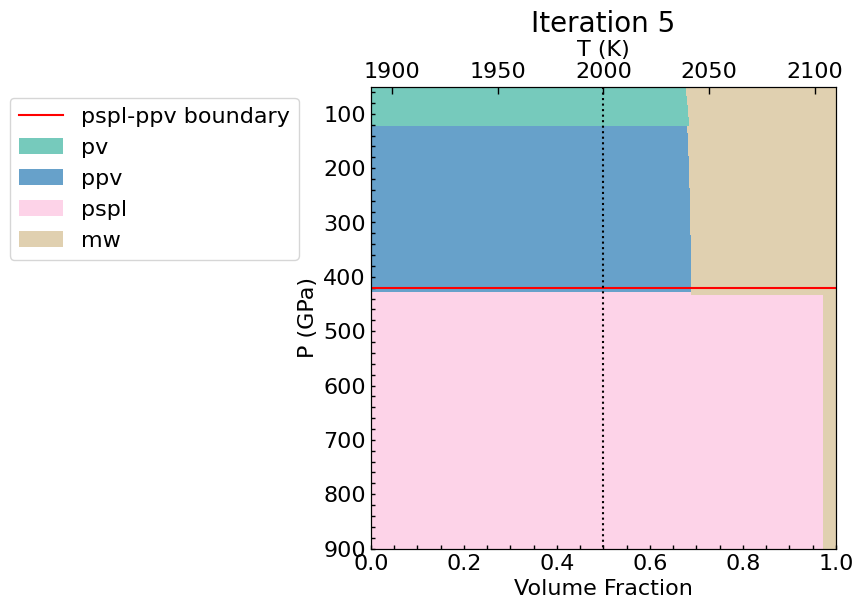

In [3]:

 
import pandas as pd
def pressure_boundary(T):
    """
    Calculate the pressure boundary for the pspl-ppv boundary.
    """
    return 450 - 15e6*T/1e9


mypath = './Test_run_F0_Theta0_800/2000K'

Number_Array = [5] # This is the best fit

F0_dir = mypath+'/Monte_Carlo_results.txt'
with open(F0_dir, 'r') as f:
        lines = f.readlines()
        # Extract the last number in each line
        F0_array = [float(line.split()[-1]) for line in lines if line.strip()]  # Ensure the line is not empty
#print('F0_array:', F0_array)

My_boundary = pd.DataFrame(columns=['Iteration','Pressure','Temperature','P_boundary_cal','F0'])
for iteration in Number_Array:
    look_path=mypath+'/Iteration_'+str(int(iteration))
    # check if fort.66 file exists and not empty
    fort_66_path = os.path.join(look_path, 'fort.66')
    
    if not os.path.exists(fort_66_path) or os.path.getsize(fort_66_path) == 0:
        print(f"Skipping iteration {iteration} as fort.66 does not exist or is empty.")
        continue
    else:
        print(f"Processing iteration {iteration}...")
        sim = Simulation(
                name='PSPL',
                title='Iteration '+str(int(iteration)),
                dir=look_path)
            # Possible functionalities
        sim.read_profile(save=False)
        sim.read_phase_fraction(save=False, fraction_type='volume')
        sim.mineral_fraction_vs_depth(contrast=False, pspl_boundary=True, more_info=False, ticks_type='pressure')
        pressure_i = sim.find_pressure(mute=True, phase_name='ppv', boundary='base')
        #sim.density_plot(ticks_type='pressure')
        My_boundary.loc[len(My_boundary)] = [iteration, pressure_i, sim.fraction['T'].iloc[-1], pressure_boundary(sim.fraction['T'].iloc[-1]), F0_array[iteration-1]]
My_boundary.to_csv(mypath+'/Boundary.csv', index=False)
        

# F0 Test

Temperature: 2000 K, F0: -1718.53
Temperature: 3000 K, F0: -1722.27
Temperature: 4000 K, F0: -1725.15
Temperature: 5000 K, F0: -1714.70


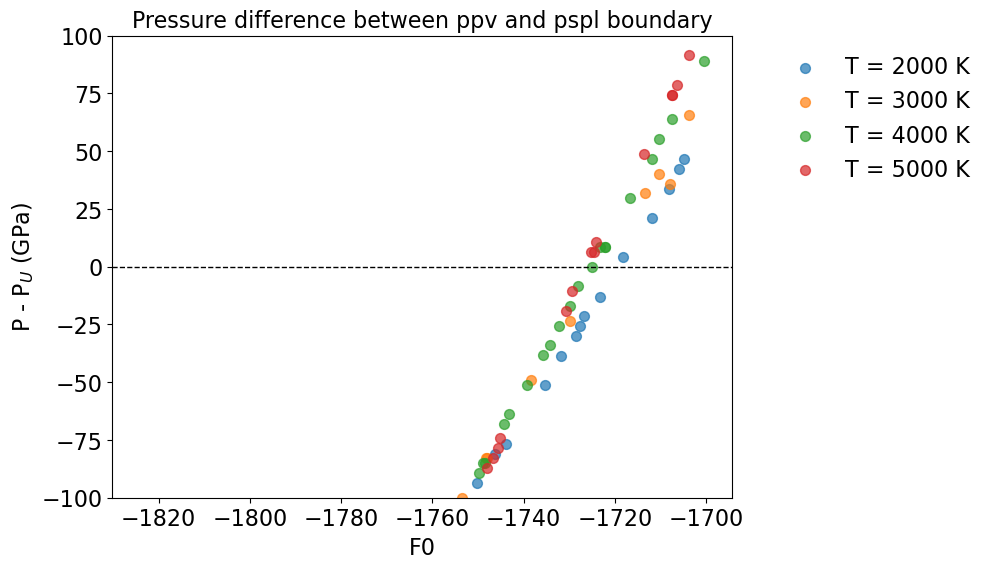

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import lmfit

def linear(x, a, b):
    """
    Linear function for fitting.
    """
    return a * x + b
def solve_linear(y, a, b):
    """
    Solve for x in the linear equation y = ax + b.
    """
    return (y - b) / a

def fit_linear(x, y):
    """
    Fit a linear function to the data.
    """
    model = lmfit.Model(linear)
    params = model.make_params(a=1, b=0)
    result = model.fit(y, params, x=x)
    return result

dir = './Test_run_F0_Theta0_800/Monte_ppv_pspl_boundary.csv'
F0_data = pd.read_csv(dir, comment='#')
Temp = [2000, 3000, 4000, 5000]
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
for i, T in enumerate(Temp):
    data = F0_data[F0_data['Temperature'] == T]
    data = data[data['Pressure']>0]
    ax.scatter(data['F0'], data['Pressure']-data['P_boundary_cal'], label=f'T = {T} K', marker='o', s=50, alpha=0.7)
    # Fit the data
    fit_result = fit_linear(data['F0'], data['Pressure'] - data['P_boundary_cal'])
    x_solved = solve_linear(0, fit_result.params['a'], fit_result.params['b'])
    print(f'Temperature: {T} K, F0: {x_solved:.2f}')
ax.axhline(0, color='k', linestyle='--', linewidth=1)
ax.set_ylim(-100, 100)
ax.set_xlabel('F0')
ax.set_ylabel(r'P - P$_{U}$ (GPa)')
ax.set_title('Pressure difference between ppv and pspl boundary')
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)

y position: 426.5787312
[[Model]]
    Model(fH2O_Cal)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 165
    # data points      = 121
    # variables        = 5
    chi-square         = 1.8430e+10
    reduced chi-square = 1.5888e+08
    Akaike info crit   = 2289.81523
    Bayesian info crit = 2303.79418
    R-squared          = 0.99991614
[[Variables]]
    a:  21.6722445 +/- 4.33748211 (20.01%) (init = 0.1)
    b: -4196.11275 +/- 895.759808 (21.35%) (init = 0.1)
    c:  1108.70085 +/- 38.6811537 (3.49%) (init = 0.1)
    d:  1.76650880 +/- 0.37856132 (21.43%) (init = 0.1)
    e: -2.56375853 +/- 0.50565969 (19.72%) (init = 0.1)
[[Correlations]] (unreported correlations are < 0.100)
    C(c, d) = -0.9982
    C(a, e) = -0.9744
    C(a, b) = -0.9288
    C(b, e) = +0.8223
    C(b, c) = -0.6143
    C(b, d) = +0.6135
    C(a, d) = -0.2801
    C(a, c) = +0.2794


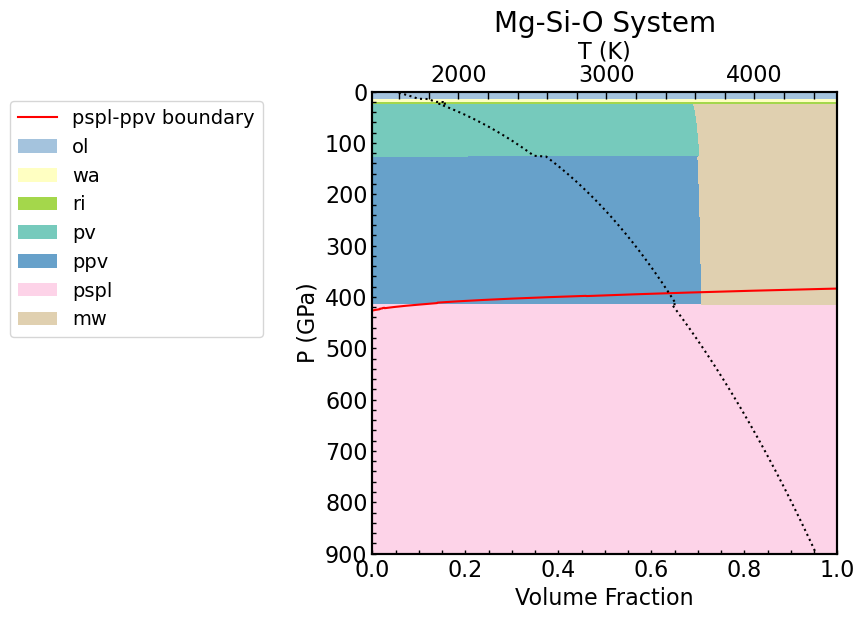

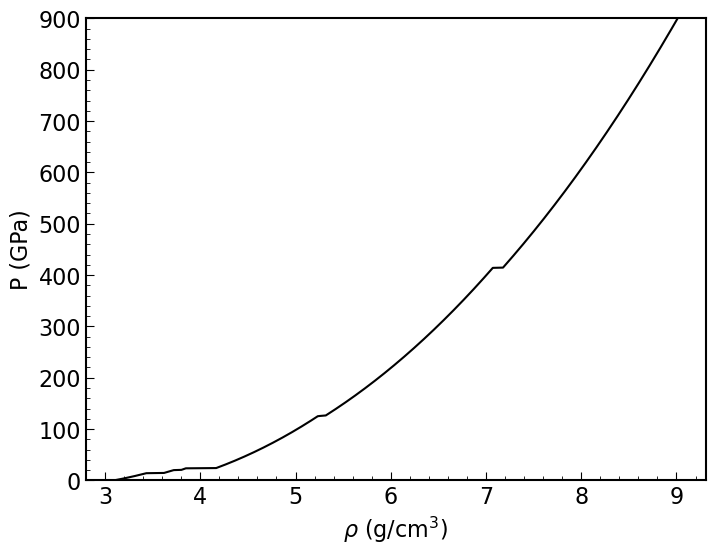

<Figure size 800x600 with 0 Axes>

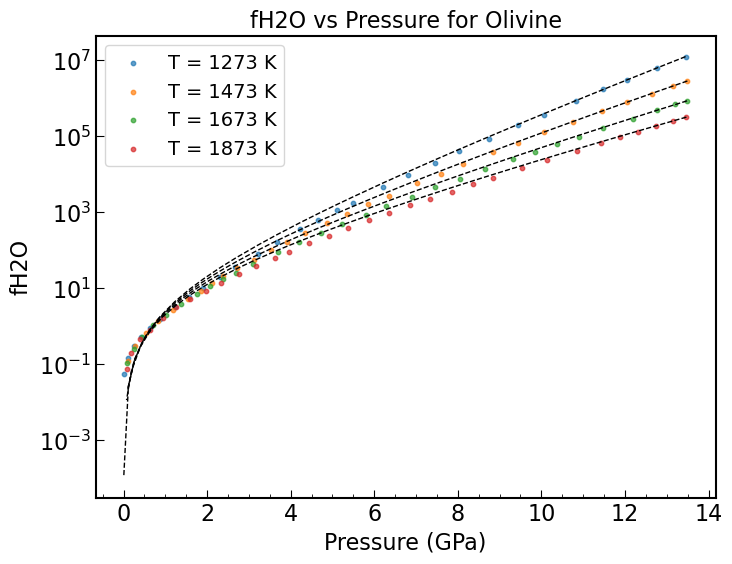

/tmp/ipykernel_290439/483637071.py:41: RuntimeWarning: divide by zero encountered in log
  return np.exp(a + b/T + c*P/T + d*np.log(P) + e*np.log(T))
/tmp/ipykernel_290439/483637071.py:62: RuntimeWarning: divide by zero encountered in log
  return np.exp(0.6447/2*np.log(fH2O_Cal(P,T, result.params['a'].value, result.params['b'].value, result.params['c'].value,result.params['d'].value, result.params['e'].value))+4905.5403/T)


[[Model]]
    Model(fH2O_Cal)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 165
    # data points      = 121
    # variables        = 5
    chi-square         = 1.8430e+10
    reduced chi-square = 1.5888e+08
    Akaike info crit   = 2289.81523
    Bayesian info crit = 2303.79418
    R-squared          = 0.99991614
[[Variables]]
    a:  21.6722445 +/- 4.33748211 (20.01%) (init = 0.1)
    b: -4196.11275 +/- 895.759808 (21.35%) (init = 0.1)
    c:  1108.70085 +/- 38.6811537 (3.49%) (init = 0.1)
    d:  1.76650880 +/- 0.37856132 (21.43%) (init = 0.1)
    e: -2.56375853 +/- 0.50565969 (19.72%) (init = 0.1)
[[Correlations]] (unreported correlations are < 0.100)
    C(c, d) = -0.9982
    C(a, e) = -0.9744
    C(a, b) = -0.9288
    C(b, e) = +0.8223
    C(b, c) = -0.6143
    C(b, d) = +0.6135
    C(a, d) = -0.2801
    C(a, c) = +0.2794


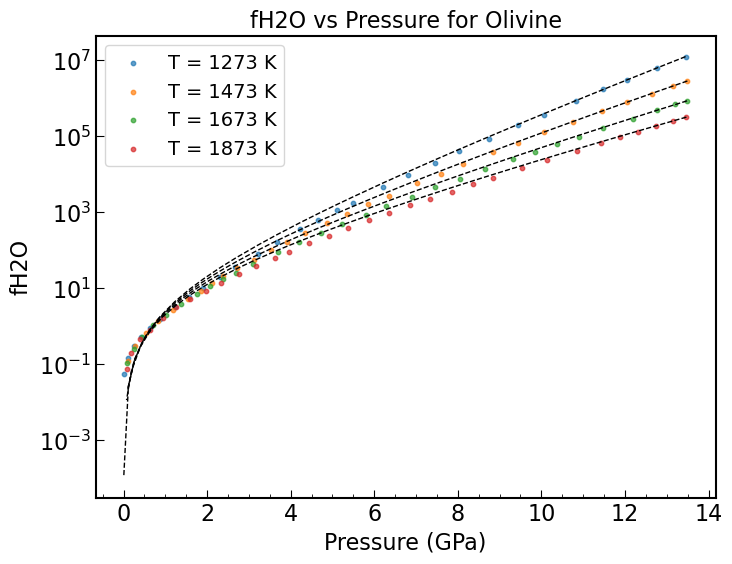

/tmp/ipykernel_290439/483637071.py:41: RuntimeWarning: divide by zero encountered in log
  return np.exp(a + b/T + c*P/T + d*np.log(P) + e*np.log(T))
/tmp/ipykernel_290439/483637071.py:62: RuntimeWarning: divide by zero encountered in log
  return np.exp(0.6447/2*np.log(fH2O_Cal(P,T, result.params['a'].value, result.params['b'].value, result.params['c'].value,result.params['d'].value, result.params['e'].value))+4905.5403/T)


[[Model]]
    Model(DH_ppv)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 22
    # data points      = 46
    # variables        = 6
    chi-square         = 0.00201040
    reduced chi-square = 5.0260e-05
    Akaike info crit   = -449.750933
    Bayesian info crit = -438.779085
    R-squared          = 0.99808176
[[Variables]]
    a:  0.81534927 +/- 0.08103409 (9.94%) (init = 0.1)
    b: -1.8119e-04 +/- 1.6986e-05 (9.37%) (init = 0.1)
    c: -0.01287925 +/- 0.00135578 (10.53%) (init = 0.1)
    d:  4.1864e-09 +/- 2.4246e-09 (57.92%) (init = 0.1)
    e:  3.2401e-05 +/- 5.8765e-06 (18.14%) (init = 0.1)
    f:  3.0371e-06 +/- 1.0310e-07 (3.39%) (init = 0.1)
[[Correlations]] (unreported correlations are < 0.100)
    C(c, e) = -0.9749
    C(a, c) = -0.9543
    C(a, e) = +0.8887
    C(b, d) = -0.7132
    C(b, f) = -0.5837
    C(a, b) = -0.3275
    C(a, f) = +0.3266
    C(c, f) = -0.1544
    C(d, f) = -0.1463
    C(a, d) = +0.1166


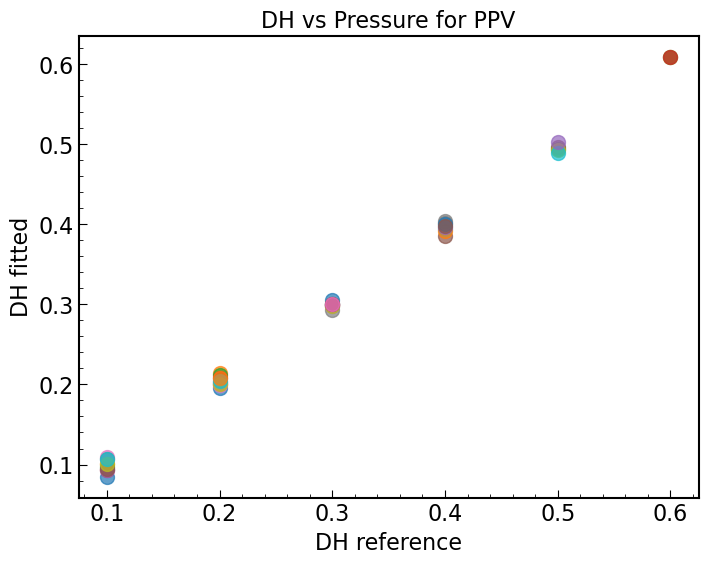

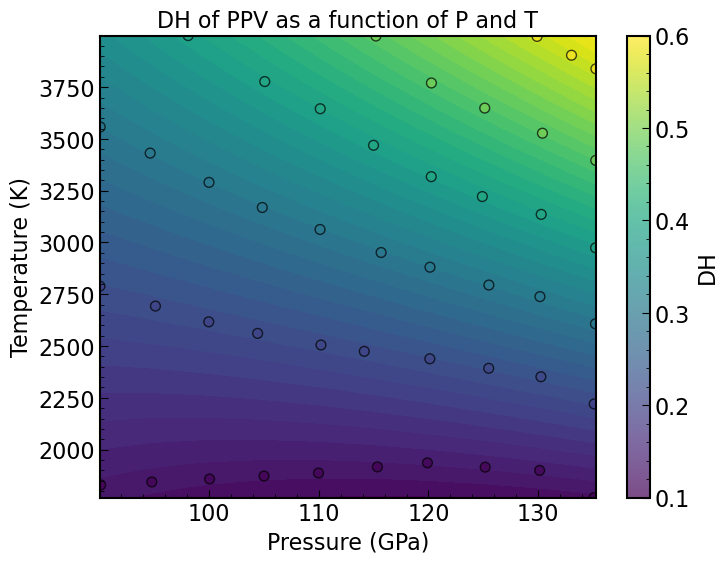

[[Model]]
    Model(DH_ppv)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 22
    # data points      = 46
    # variables        = 6
    chi-square         = 0.00201040
    reduced chi-square = 5.0260e-05
    Akaike info crit   = -449.750933
    Bayesian info crit = -438.779085
    R-squared          = 0.99808176
[[Variables]]
    a:  0.81534927 +/- 0.08103409 (9.94%) (init = 0.1)
    b: -1.8119e-04 +/- 1.6986e-05 (9.37%) (init = 0.1)
    c: -0.01287925 +/- 0.00135578 (10.53%) (init = 0.1)
    d:  4.1864e-09 +/- 2.4246e-09 (57.92%) (init = 0.1)
    e:  3.2401e-05 +/- 5.8765e-06 (18.14%) (init = 0.1)
    f:  3.0371e-06 +/- 1.0310e-07 (3.39%) (init = 0.1)
[[Correlations]] (unreported correlations are < 0.100)
    C(c, e) = -0.9749
    C(a, c) = -0.9543
    C(a, e) = +0.8887
    C(b, d) = -0.7132
    C(b, f) = -0.5837
    C(a, b) = -0.3275
    C(a, f) = +0.3266
    C(c, f) = -0.1544
    C(d, f) = -0.1463
    C(a, d) = +0.1166


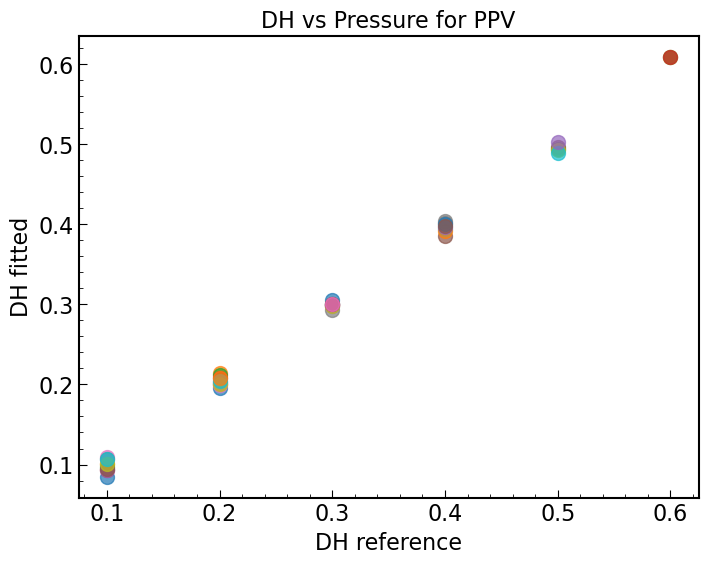

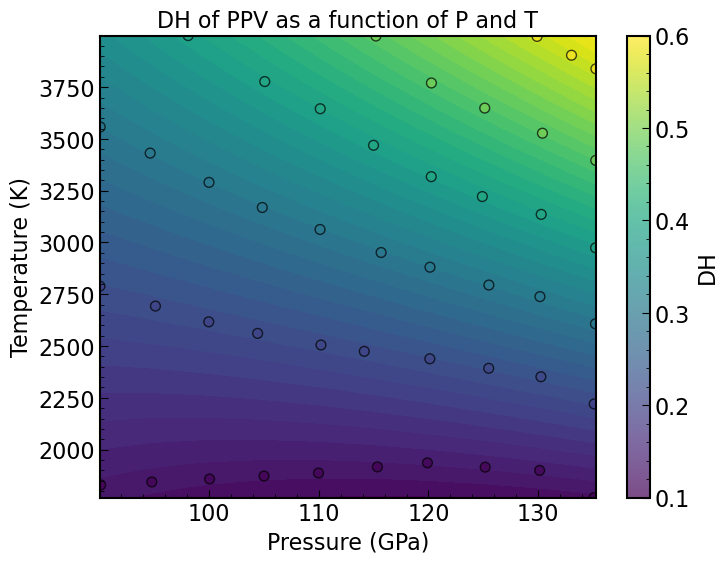

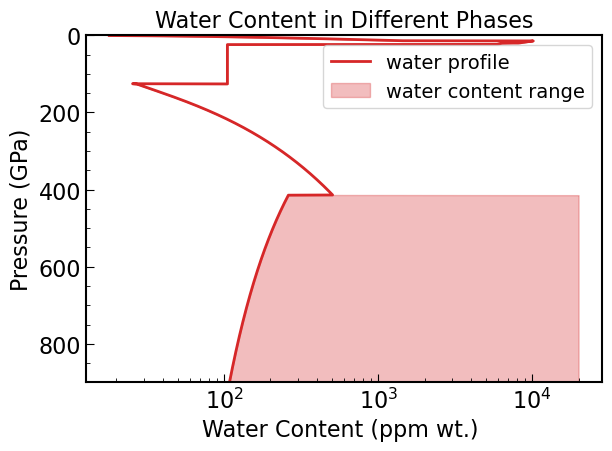

[[Model]]
    Model(H2O_Eos_7)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 79
    # data points      = 66
    # variables        = 12
    chi-square         = 56.3253176
    reduced chi-square = 1.04306144
    Akaike info crit   = 13.5382993
    Bayesian info crit = 39.8141562
    R-squared          = 0.99629897
[[Variables]]
    a0:  3.2326e+08 +/- 28457108.6 (8.80%) (init = 1)
    a1: -255074.091 +/- 32103.8397 (12.59%) (init = 1)
    a2:  45.9036998 +/- 6.24549017 (13.61%) (init = 1)
    b0:  16.6050587 +/- 1.35619289 (8.17%) (init = 1)
    b1: -0.00139138 +/- 0.00123785 (88.97%) (init = 1)
    b2:  1.7795e-07 +/- 1.7322e-07 (97.34%) (init = 1)
    c0: -0.01272991 +/- 0.00272650 (21.42%) (init = 1)
    c1:  1.2942e-06 +/- 2.4757e-06 (191.29%) (init = 1)
    c2: -1.1447e-10 +/- 3.4377e-10 (300.32%) (init = 0)
    d0:  2.6478e-06 +/- 9.4395e-07 (35.65%) (init = 1)
    d1: -9.2136e-11 +/- 8.6558e-10 (939.45%) (init = 1)
    d2: -1.0861e-14 +/- 1.2002e-1

/tmp/ipykernel_290439/483637071.py:285: RuntimeWarning: divide by zero encountered in scalar divide
  return R*T/P +b - a*R*np.sqrt(T)/(R*T+b*P)/(R*T+2*b*P) + c*np.sqrt(P) + d*P


[[Model]]
    Model(H2O_Eos_7)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 79
    # data points      = 66
    # variables        = 12
    chi-square         = 56.3253176
    reduced chi-square = 1.04306144
    Akaike info crit   = 13.5382993
    Bayesian info crit = 39.8141562
    R-squared          = 0.99629897
[[Variables]]
    a0:  3.2326e+08 +/- 28457108.6 (8.80%) (init = 1)
    a1: -255074.091 +/- 32103.8397 (12.59%) (init = 1)
    a2:  45.9036998 +/- 6.24549017 (13.61%) (init = 1)
    b0:  16.6050587 +/- 1.35619289 (8.17%) (init = 1)
    b1: -0.00139138 +/- 0.00123785 (88.97%) (init = 1)
    b2:  1.7795e-07 +/- 1.7322e-07 (97.34%) (init = 1)
    c0: -0.01272991 +/- 0.00272650 (21.42%) (init = 1)
    c1:  1.2942e-06 +/- 2.4757e-06 (191.29%) (init = 1)
    c2: -1.1447e-10 +/- 3.4377e-10 (300.32%) (init = 0)
    d0:  2.6478e-06 +/- 9.4395e-07 (35.65%) (init = 1)
    d1: -9.2136e-11 +/- 8.6558e-10 (939.45%) (init = 1)
    d2: -1.0861e-14 +/- 1.2002e-1

/tmp/ipykernel_290439/483637071.py:285: RuntimeWarning: divide by zero encountered in scalar divide
  return R*T/P +b - a*R*np.sqrt(T)/(R*T+b*P)/(R*T+2*b*P) + c*np.sqrt(P) + d*P


[[Model]]
    Model(H2O_Eos_7)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 79
    # data points      = 66
    # variables        = 12
    chi-square         = 56.3253176
    reduced chi-square = 1.04306144
    Akaike info crit   = 13.5382993
    Bayesian info crit = 39.8141562
    R-squared          = 0.99629897
[[Variables]]
    a0:  3.2326e+08 +/- 28457108.6 (8.80%) (init = 1)
    a1: -255074.091 +/- 32103.8397 (12.59%) (init = 1)
    a2:  45.9036998 +/- 6.24549017 (13.61%) (init = 1)
    b0:  16.6050587 +/- 1.35619289 (8.17%) (init = 1)
    b1: -0.00139138 +/- 0.00123785 (88.97%) (init = 1)
    b2:  1.7795e-07 +/- 1.7322e-07 (97.34%) (init = 1)
    c0: -0.01272991 +/- 0.00272650 (21.42%) (init = 1)
    c1:  1.2942e-06 +/- 2.4757e-06 (191.29%) (init = 1)
    c2: -1.1447e-10 +/- 3.4377e-10 (300.32%) (init = 0)
    d0:  2.6478e-06 +/- 9.4395e-07 (35.65%) (init = 1)
    d1: -9.2136e-11 +/- 8.6558e-10 (939.45%) (init = 1)
    d2: -1.0861e-14 +/- 1.2002e-1

/tmp/ipykernel_290439/483637071.py:285: RuntimeWarning: divide by zero encountered in scalar divide
  return R*T/P +b - a*R*np.sqrt(T)/(R*T+b*P)/(R*T+2*b*P) + c*np.sqrt(P) + d*P


[[Model]]
    Model(H2O_Eos_7)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 79
    # data points      = 66
    # variables        = 12
    chi-square         = 56.3253176
    reduced chi-square = 1.04306144
    Akaike info crit   = 13.5382993
    Bayesian info crit = 39.8141562
    R-squared          = 0.99629897
[[Variables]]
    a0:  3.2326e+08 +/- 28457108.6 (8.80%) (init = 1)
    a1: -255074.091 +/- 32103.8397 (12.59%) (init = 1)
    a2:  45.9036998 +/- 6.24549017 (13.61%) (init = 1)
    b0:  16.6050587 +/- 1.35619289 (8.17%) (init = 1)
    b1: -0.00139138 +/- 0.00123785 (88.97%) (init = 1)
    b2:  1.7795e-07 +/- 1.7322e-07 (97.34%) (init = 1)
    c0: -0.01272991 +/- 0.00272650 (21.42%) (init = 1)
    c1:  1.2942e-06 +/- 2.4757e-06 (191.29%) (init = 1)
    c2: -1.1447e-10 +/- 3.4377e-10 (300.32%) (init = 0)
    d0:  2.6478e-06 +/- 9.4395e-07 (35.65%) (init = 1)
    d1: -9.2136e-11 +/- 8.6558e-10 (939.45%) (init = 1)
    d2: -1.0861e-14 +/- 1.2002e-1

/tmp/ipykernel_290439/483637071.py:285: RuntimeWarning: divide by zero encountered in scalar divide
  return R*T/P +b - a*R*np.sqrt(T)/(R*T+b*P)/(R*T+2*b*P) + c*np.sqrt(P) + d*P


[[Model]]
    Model(H2O_Eos_7)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 79
    # data points      = 66
    # variables        = 12
    chi-square         = 56.3253176
    reduced chi-square = 1.04306144
    Akaike info crit   = 13.5382993
    Bayesian info crit = 39.8141562
    R-squared          = 0.99629897
[[Variables]]
    a0:  3.2326e+08 +/- 28457108.6 (8.80%) (init = 1)
    a1: -255074.091 +/- 32103.8397 (12.59%) (init = 1)
    a2:  45.9036998 +/- 6.24549017 (13.61%) (init = 1)
    b0:  16.6050587 +/- 1.35619289 (8.17%) (init = 1)
    b1: -0.00139138 +/- 0.00123785 (88.97%) (init = 1)
    b2:  1.7795e-07 +/- 1.7322e-07 (97.34%) (init = 1)
    c0: -0.01272991 +/- 0.00272650 (21.42%) (init = 1)
    c1:  1.2942e-06 +/- 2.4757e-06 (191.29%) (init = 1)
    c2: -1.1447e-10 +/- 3.4377e-10 (300.32%) (init = 0)
    d0:  2.6478e-06 +/- 9.4395e-07 (35.65%) (init = 1)
    d1: -9.2136e-11 +/- 8.6558e-10 (939.45%) (init = 1)
    d2: -1.0861e-14 +/- 1.2002e-1

/tmp/ipykernel_290439/483637071.py:285: RuntimeWarning: divide by zero encountered in scalar divide
  return R*T/P +b - a*R*np.sqrt(T)/(R*T+b*P)/(R*T+2*b*P) + c*np.sqrt(P) + d*P


[[Model]]
    Model(H2O_Eos_7)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 79
    # data points      = 66
    # variables        = 12
    chi-square         = 56.3253176
    reduced chi-square = 1.04306144
    Akaike info crit   = 13.5382993
    Bayesian info crit = 39.8141562
    R-squared          = 0.99629897
[[Variables]]
    a0:  3.2326e+08 +/- 28457108.6 (8.80%) (init = 1)
    a1: -255074.091 +/- 32103.8397 (12.59%) (init = 1)
    a2:  45.9036998 +/- 6.24549017 (13.61%) (init = 1)
    b0:  16.6050587 +/- 1.35619289 (8.17%) (init = 1)
    b1: -0.00139138 +/- 0.00123785 (88.97%) (init = 1)
    b2:  1.7795e-07 +/- 1.7322e-07 (97.34%) (init = 1)
    c0: -0.01272991 +/- 0.00272650 (21.42%) (init = 1)
    c1:  1.2942e-06 +/- 2.4757e-06 (191.29%) (init = 1)
    c2: -1.1447e-10 +/- 3.4377e-10 (300.32%) (init = 0)
    d0:  2.6478e-06 +/- 9.4395e-07 (35.65%) (init = 1)
    d1: -9.2136e-11 +/- 8.6558e-10 (939.45%) (init = 1)
    d2: -1.0861e-14 +/- 1.2002e-1

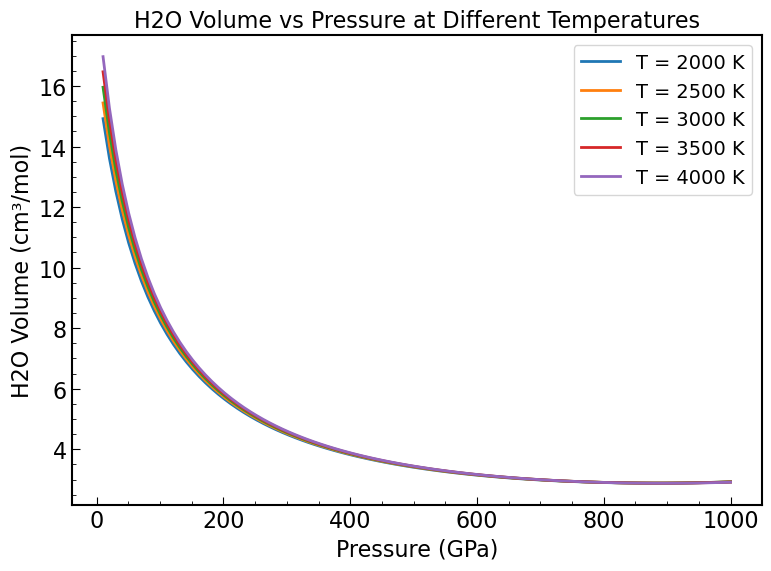

Total mass: 141.09184399999998 g/cm³
[[Model]]
    Model(H2O_Eos_7)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 79
    # data points      = 66
    # variables        = 12
    chi-square         = 56.3253176
    reduced chi-square = 1.04306144
    Akaike info crit   = 13.5382993
    Bayesian info crit = 39.8141562
    R-squared          = 0.99629897
[[Variables]]
    a0:  3.2326e+08 +/- 28457108.6 (8.80%) (init = 1)
    a1: -255074.091 +/- 32103.8397 (12.59%) (init = 1)
    a2:  45.9036998 +/- 6.24549017 (13.61%) (init = 1)
    b0:  16.6050587 +/- 1.35619289 (8.17%) (init = 1)
    b1: -0.00139138 +/- 0.00123785 (88.97%) (init = 1)
    b2:  1.7795e-07 +/- 1.7322e-07 (97.34%) (init = 1)
    c0: -0.01272991 +/- 0.00272650 (21.42%) (init = 1)
    c1:  1.2942e-06 +/- 2.4757e-06 (191.29%) (init = 1)
    c2: -1.1447e-10 +/- 3.4377e-10 (300.32%) (init = 0)
    d0:  2.6478e-06 +/- 9.4395e-07 (35.65%) (init = 1)
    d1: -9.2136e-11 +/- 8.6558e-10 (939.45%) (init =

/tmp/ipykernel_290439/483637071.py:285: RuntimeWarning: divide by zero encountered in scalar divide
  return R*T/P +b - a*R*np.sqrt(T)/(R*T+b*P)/(R*T+2*b*P) + c*np.sqrt(P) + d*P


[[Model]]
    Model(H2O_Eos_7)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 79
    # data points      = 66
    # variables        = 12
    chi-square         = 56.3253176
    reduced chi-square = 1.04306144
    Akaike info crit   = 13.5382993
    Bayesian info crit = 39.8141562
    R-squared          = 0.99629897
[[Variables]]
    a0:  3.2326e+08 +/- 28457108.6 (8.80%) (init = 1)
    a1: -255074.091 +/- 32103.8397 (12.59%) (init = 1)
    a2:  45.9036998 +/- 6.24549017 (13.61%) (init = 1)
    b0:  16.6050587 +/- 1.35619289 (8.17%) (init = 1)
    b1: -0.00139138 +/- 0.00123785 (88.97%) (init = 1)
    b2:  1.7795e-07 +/- 1.7322e-07 (97.34%) (init = 1)
    c0: -0.01272991 +/- 0.00272650 (21.42%) (init = 1)
    c1:  1.2942e-06 +/- 2.4757e-06 (191.29%) (init = 1)
    c2: -1.1447e-10 +/- 3.4377e-10 (300.32%) (init = 0)
    d0:  2.6478e-06 +/- 9.4395e-07 (35.65%) (init = 1)
    d1: -9.2136e-11 +/- 8.6558e-10 (939.45%) (init = 1)
    d2: -1.0861e-14 +/- 1.2002e-1

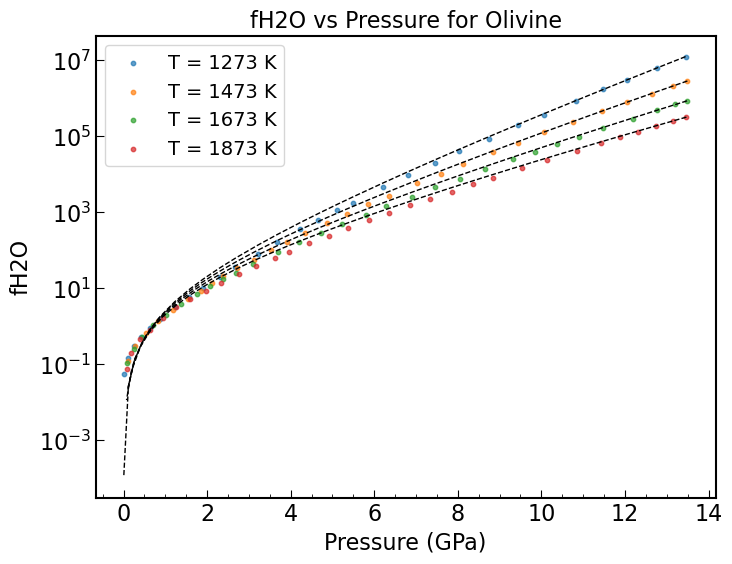

/tmp/ipykernel_290439/483637071.py:41: RuntimeWarning: divide by zero encountered in log
  return np.exp(a + b/T + c*P/T + d*np.log(P) + e*np.log(T))
/tmp/ipykernel_290439/483637071.py:62: RuntimeWarning: divide by zero encountered in log
  return np.exp(0.6447/2*np.log(fH2O_Cal(P,T, result.params['a'].value, result.params['b'].value, result.params['c'].value,result.params['d'].value, result.params['e'].value))+4905.5403/T)
/tmp/ipykernel_290439/483637071.py:390: RuntimeWarning: invalid value encountered in divide
  H2O_volume = H2O_content / H2O_density  # Convert ppm wt. to cm³/mol


ol volume: (29,)
ol H2O content: (29, 16)
ol H2O density: (29,)
ol density: 0          NaN
1     3.106792
2     3.120917
3     3.134803
4     3.148482
5     3.161956
6     3.175244
7     3.188335
8     3.201240
9     3.213978
10    3.226537
11    3.238926
12    3.251165
13    3.263232
14    3.275146
15    3.286915
16    3.298527
17    3.309990
18    3.321303
19    3.332471
20    3.343493
21    3.354374
22    3.365112
23    3.375691
24    3.386126
25    3.396403
26    3.406534
27    3.416493
28    3.426292
Name: rho, dtype: float64 g/cm³
[[Model]]
    Model(H2O_Eos_7)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 79
    # data points      = 66
    # variables        = 12
    chi-square         = 56.3253176
    reduced chi-square = 1.04306144
    Akaike info crit   = 13.5382993
    Bayesian info crit = 39.8141562
    R-squared          = 0.99629897
[[Variables]]
    a0:  3.2326e+08 +/- 28457108.6 (8.80%) (init = 1)
    a1: -255074.091 +/- 32103.8397 (12.59%

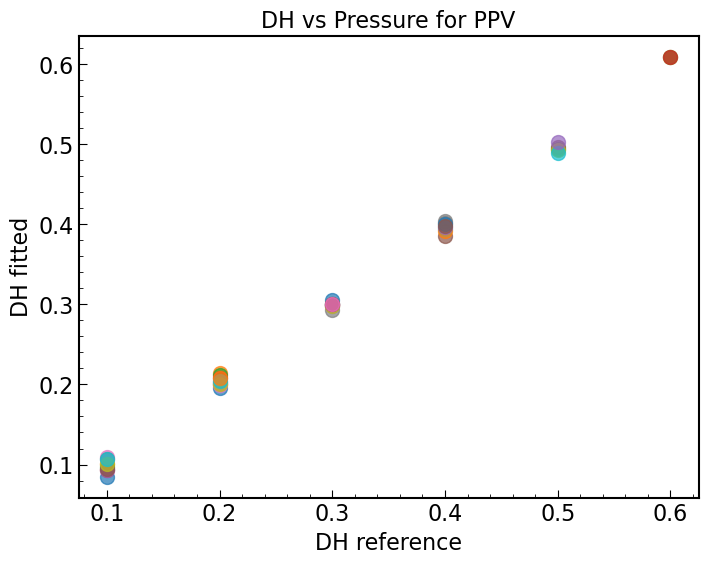

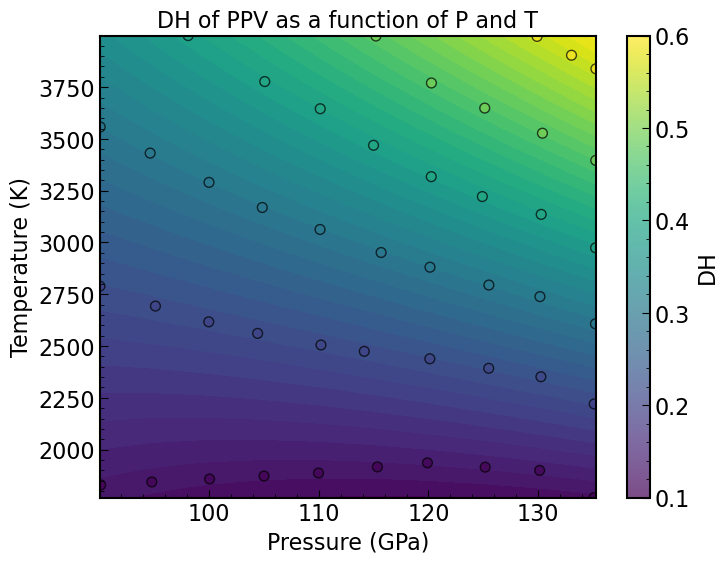

ppv volume: (578,)
ppv H2O content: (578, 16)
ppv H2O density: (578,)
ppv density: 251    5.407109
252    5.409500
253    5.412215
254    5.416293
255    5.420361
         ...   
824    7.102342
825    7.104637
826    7.106932
827    7.109217
828    7.111511
Name: rho, Length: 578, dtype: float64 g/cm³
[[Model]]
    Model(H2O_Eos_7)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 79
    # data points      = 66
    # variables        = 12
    chi-square         = 56.3253176
    reduced chi-square = 1.04306144
    Akaike info crit   = 13.5382993
    Bayesian info crit = 39.8141562
    R-squared          = 0.99629897
[[Variables]]
    a0:  3.2326e+08 +/- 28457108.6 (8.80%) (init = 1)
    a1: -255074.091 +/- 32103.8397 (12.59%) (init = 1)
    a2:  45.9036998 +/- 6.24549017 (13.61%) (init = 1)
    b0:  16.6050587 +/- 1.35619289 (8.17%) (init = 1)
    b1: -0.00139138 +/- 0.00123785 (88.97%) (init = 1)
    b2:  1.7795e-07 +/- 1.7322e-07 (97.34%) (init = 1)
    c0:

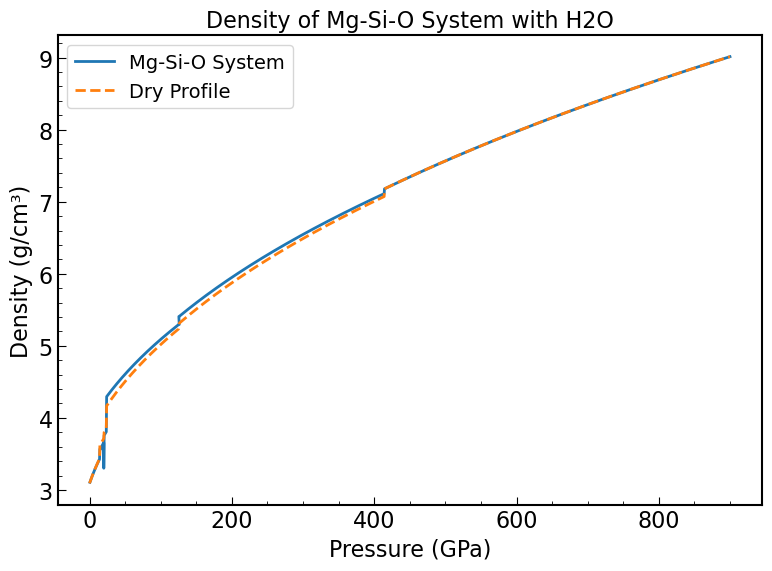

y position: 425.6782509


"\n# Mg-Si-O System Simulation Example\nTotal_mass = 2.01*40.3044+60.08\n#Total_volume = Total_mass/sim.profile['rho']\nprint('Total mass:', Total_mass, 'g/cm³')\n#print('Total volume:', Total_volume, 'cm³/mol')\npressure_array = []\ndensity_new_array = []\nfor i, name_i in enumerate(['ol', 'wa', 'ri', 'pv', 'ppv', 'pspl']):\n    phase_test = molar_fraction[molar_fraction[name_i] > 0]\n    #phase_volume = phase_test[name_i] * Total_volume\n    phase_fraction =  sim.fraction[(sim.fraction['P'] <= phase_test['P'].max()) & (sim.fraction['P'] >= phase_test['P'].min())]\n    total_density_test = sim.profile['rho'][(sim.profile['P'] <= phase_test['P'].max()) & (sim.profile['P'] >= phase_test['P'].min())]\n    total_volume = Total_mass / total_density_test  # cm³/mol\n    phase_volume = phase_fraction[name_i].values * total_volume  # cm³/mol    \n\n    phase_density_test = phase_density[(phase_density['P'] <= phase_test['P'].max()) & (phase_density['P'] >= phase_test['P'].min())]\n    \n    H

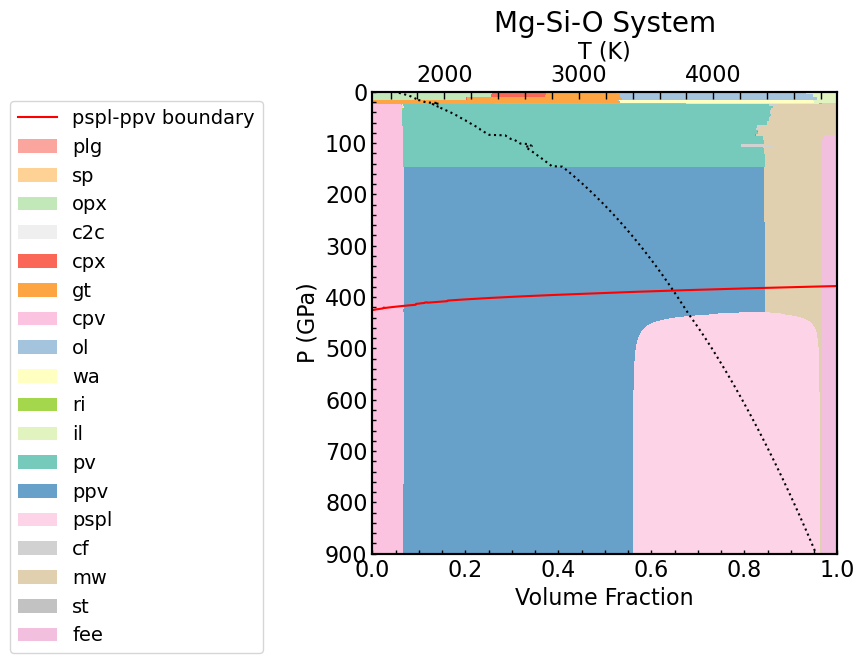

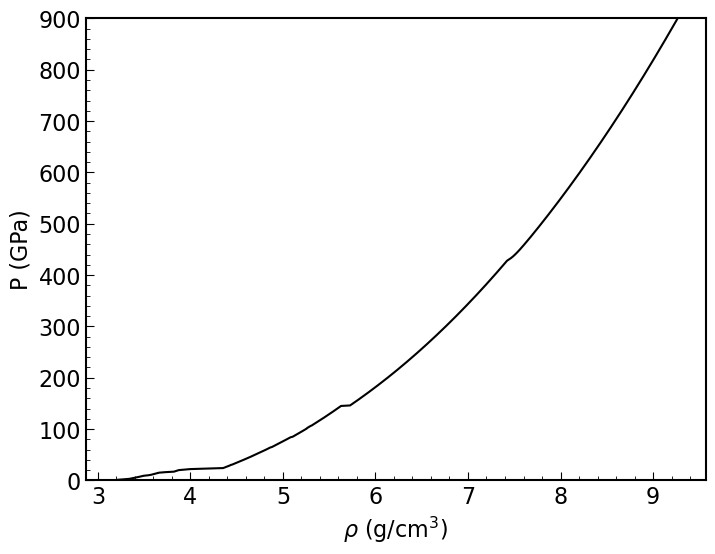

In [ ]:
import lmfit

plt.rcParams['font.size'] = 16
plt.rcParams['axes.linewidth'] = 1.5
plt.rcParams['xtick.major.size'] = 6
plt.rcParams['xtick.minor.size'] = 3
plt.rcParams['ytick.major.size'] = 6
plt.rcParams['ytick.minor.size'] = 3
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['legend.fontsize'] = 14
plt.rcParams['xtick.minor.visible'] = True
plt.rcParams['ytick.minor.visible'] = True
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'


sim = Simulation(
        name='PSPL_Test',
        title='Mg-Si-O System',
        dir='./Simulation_data')
    # Possible functionalities
sim.read_profile(save=False)
sim.read_phase_fraction(save=False, fraction_type='volume')
sim.read_phase_density(save=False)
molar_fraction = sim.fraction
#print(molar_fraction.head())
phase_density = sim.phase_density


sim.mineral_fraction_vs_depth(contrast=False, pspl_boundary=True, more_info=False, ticks_type='pressure')
sim.density_plot(ticks_type='pressure', save=True)

def C_H2O_(name, P, T, XFe=None, wet=False, Aluminum=False):
    if name == 'wa':
        return np.exp(-7.6356 + 13739.5371/T)*1e4
    elif name == 'ri':
        return np.exp(-6.8856 + 12206.2676/T)*1e4
    elif name == 'ol':
        def fH2O_Cal(P, T, a, b, c, d, e):
           return np.exp(a + b/T + c*P/T + d*np.log(P) + e*np.log(T))
        read_fH2O = pd.read_csv('/projects/JIEDENG/Donghao/Group_Tutorial/HeFESTo_modified/Real_test_runs/FH20/fH20.csv', comment='#')
        T_data,P_data,fH2O_data = read_fH2O['T'].values, read_fH2O['P'].values, read_fH2O['fH2O'].values
        # fit the fH2O data by lmfit
        model = lmfit.Model(fH2O_Cal, independent_vars=['P', 'T'])
        params = model.make_params(a=0.1, b=0.1, c=0.1, d=0.1, e=0.1)
        result = model.fit(fH2O_data, params, P=P_data, T=T_data)
        print(result.fit_report())
        plt.figure(figsize=(8, 6))
        for idx, ti in enumerate(np.unique(T_data)):
            data_i = read_fH2O[read_fH2O['T'] == ti]
            plt.scatter(data_i['P'], data_i['fH2O'], label=f'T = {ti} K', s=10, alpha=0.7)
            plt.plot(data_i['P'], fH2O_Cal(data_i['P'],data_i['T'], result.params['a'].value, result.params['b'].value, result.params['c'].value,result.params['d'].value, result.params['e'].value), color='k', linestyle='--', linewidth=1)
        plt.xlabel('Pressure (GPa)')
        plt.ylabel('fH2O')
        plt.yscale('log')
        plt.title('fH2O vs Pressure for Olivine')
        plt.legend()
        plt.show()
        #print('fH2O parameters:', result.params)
        #print('log(fH2O):',fH2O_Cal(P,T, result.params['a'].value, result.params['b'].value, result.params['c'].value,result.params['d'].value, result.params['e'].value))
        return np.exp(0.6447/2*np.log(fH2O_Cal(P,T, result.params['a'].value, result.params['b'].value, result.params['c'].value,result.params['d'].value, result.params['e'].value))+4905.5403/T)
        #def c_H2O_Ol(P, T, X_Fe, a, b, c, d, n):
        """
        Calculate the water content in olivine.
        """
            #return np.exp(np.log(0.5/n)+a + b/T + c*P/T + d*X_Fe/T)* (fH2O_Cal(P, T, result.params['a'].value, result.params['b'].value, result.params['c'].value,result.params['d'].value, result.params['e'].value))**(n/2)
        #read_Ol = pd.read_csv('/projects/JIEDENG/Donghao/Group_Tutorial/HeFESTo_modified/Real_test_runs/FH20/olivine.csv', comment='#')
        #T_data, P_data, X_Fe_data, H2O_data = read_Ol['T(K)'].values, read_Ol['P(GPa)'].values, read_Ol['Fe/(Mg+Fe)'].values, read_Ol['H2O_corrected_ppm'].values
        # fit the H2O data by lmfit
        #model = lmfit.Model(c_H2O_Ol, independent_vars=['P', 'T', 'X_Fe'])
        #params = model.make_params(a=0.1, b=0.1, c=0.1, d=0.1, n=1)
        #result = model.fit(H2O_data, params, P=P_data, T=T_data, X_Fe=X_Fe_data)
        #print(result.fit_report())
    elif name == 'pv':
        return 105*np.ones(len(P))  # Assuming a constant water content for perovskite
    elif name == 'ppv':
        if not Aluminum:
            dir_ppv = '/projects/JIEDENG/Donghao/Group_Tutorial/HeFESTo_modified/Real_test_runs/FH20/ppv.csv'
        else:
            dir_ppv = '/projects/JIEDENG/Donghao/Group_Tutorial/HeFESTo_modified/Real_test_runs/FH20/ppv_Al.csv'    
        read_ppv = pd.read_csv(dir_ppv, comment='#')
        def DH_ppv(P, T, a, b, c, d, e, f):
            """
            Calculate the water content in ppv.
            """
            return a + b*T + c*P + d*T**2 + e*P**2 + f*T*P
        model = lmfit.Model(DH_ppv, independent_vars=['P', 'T'])
        params = model.make_params(a=0.1, b=0.1, c=0.1, d=0.1, e=0.1, f=0.1)
        T_data, P_data, DH_data = read_ppv['T'].values, read_ppv['P'].values, read_ppv['DH'].values
        result = model.fit(DH_data, params, P=P_data, T=T_data)
        print(result.fit_report())
        plt.figure(figsize=(8, 6))
        for idx, ti in enumerate(np.unique(T_data)):
            data_i = read_ppv[read_ppv['T'] == ti]
            plt.scatter(data_i['DH'], DH_ppv(data_i['P'], data_i['T'], result.params['a'].value, result.params['b'].value, result.params['c'].value, result.params['d'].value, result.params['e'].value, result.params['f'].value), s=100, alpha=0.7)
        plt.xlabel('DH reference')
        plt.ylabel('DH fitted')
        plt.title('DH vs Pressure for PPV')
        plt.show()
        
        plt.figure(figsize=(8, 6))
        # plot DH as a function of T and P
        T_grid, P_grid = np.meshgrid(np.unique(T_data), np.unique(P_data))
        DH_grid = DH_ppv(P_grid, T_grid, result.params['a'].value, result.params['b'].value, result.params['c'].value, result.params['d'].value, result.params['e'].value, result.params['f'].value)
        plt.contourf( P_grid, T_grid,DH_grid, levels=50, cmap='viridis')
        # plot the original data points
        plt.scatter(P_data, T_data, c=DH_data, cmap='viridis', s=50, edgecolor='k', alpha=0.7)
        plt.colorbar(label='DH')
        plt.ylabel('Temperature (K)')
        plt.xlabel('Pressure (GPa)')
        plt.title('DH of PPV as a function of P and T')
        plt.show()
        C_pv = C_H2O_('pv', P, T, XFe)
        DH_calculated = DH_ppv(P, T, result.params['a'].value, result.params['b'].value, result.params['c'].value, result.params['d'].value, result.params['e'].value, result.params['f'].value)
        #print('DH', DH_calculated)
        return C_pv * DH_calculated
    #elif name == 'opx':
        #return
    elif name == 'opx':
        #parameters from Table S4
        A_opx = 0.01354
        n_opx = 0.5
        ΔV_opx = 12.1  #cm^3/mol
        ΔH_opx = -4563  #J/mol

        A_ol = 0.0066
        n_ol = 1.0
        ΔV_ol = 10.6  #cm^3/mol
        ΔH_ol = 0.0   #assumed

        R = 8.314  #J/mol/K

        #from bar to Pa
        P_pa = P * 1e5

        #calculate exponential term
        delta_H = ΔH_opx - ΔH_ol
        delta_V = (ΔV_opx - ΔV_ol) * 1e-6  # convert cm^3 to m^3
        exp_term = np.exp(-(delta_H + delta_V * P_pa) / (R * T))

        #simplify by assuming fH2O ≈ 1 (no fugacity correction)
        D_opx_ol = (A_opx / A_ol) * exp_term

        #get water content in olivine
        C_ol = C_H2O_('ol', P, T)

        return C_ol / D_opx_ol
    #elif name == 'cpx':
        #return
    elif name == 'pspl':
        if wet:
            return np.exp(-7.6356 + 13739.5371/T)*1e4
        else:
            #water_content = C_H2O_('ol', P, T)
            water_content = 2e4* np.ones(len(P))  # Assuming a constant water content for pspl
            return water_content
            #return 105*np.ones(len(P)) # Assuming a constant water content for pspl
    #elif name == 'pv':
     #   if XFe == None:
      #      XFe = 0.1
      #  a0 = -8.9430
      #  a1 = 14348.6297
      #  a2 = 80.1977
      #  a3 = -1931.4337

      #  T_inv = 1 / T
      #  P_over_T = P / T
      #  XFe_over_T = XFe / T

      #  lnC = a0 + a1 * T_inv + a2 * P_over_T + a3 * XFe_over_T
      #  return np.exp(lnC)

    #elif name == 'ppv':
    #    if XFe is None:
    #        XFe = 0.1
    #    D_bdg_ppv = 10  #in the essay they were using this value
        # We lack direct experimental fitting for ppv, so we estimate its H2O capacity
        # using the pv result scaled by a constant ratio based on the literature.
    #    C_pv = C_H2O_('pv', P, T, XFe)
    #    return C_pv / D_bdg_ppv

plt.figure(figsize=(8, 6))
Pressure_array = []
Water_content_array = []
Water_content_array_min = []
for i, name_i in enumerate(['ol', 'wa', 'ri', 'pv', 'ppv', 'pspl']):
    phase_test = molar_fraction[molar_fraction[name_i] > 0]
    phase_water = C_H2O_(name_i, phase_test['P'].values, phase_test['T'].values, wet=True, Aluminum=False)
    phase_water_min = C_H2O_(name_i, phase_test['P'].values, phase_test['T'].values, wet=False, Aluminum=False)
    #print(name_i+' water content: ', phase_water)
    Pressure_array.append(phase_test['P'].values)
    #plt.plot(phase_water, phase_test['P'].values, color='C'+str(i), linestyle='-', linewidth=2, label=name_i)
    Water_content_array.append(phase_water)
    Water_content_array_min.append(phase_water_min)
Pressure_array = np.concatenate(Pressure_array)
Water_content_array = np.concatenate(Water_content_array)
Water_content_array_min = np.concatenate(Water_content_array_min)
plt.plot(Water_content_array[1:],Pressure_array[1:], color='C3', linestyle='-', linewidth=2, label='water profile')
plt.fill_betweenx(Pressure_array[1:], Water_content_array_min[1:], Water_content_array[1:], color='C3', alpha=0.3, label='water content range')
plt.ylabel('Pressure (GPa)')
plt.gca().invert_yaxis()
plt.xscale('log')
#plt.xlim(1e-2, 1e6)
plt.ylim(Pressure_array.max(), 0)
plt.xlabel('Water Content (ppm wt.) ')
plt.title('Water Content in Different Phases')
plt.legend()
plt.tight_layout()
plt.show()

def H2O_Eos_5_OR_6(P, T):
    """
    Calculate the water content in olivine.
    a, b, c, d are from Table 3 of the paper "Experimental measurements of the properties of H20-COz mixtures at high pressures and temperatures" by DANIEL J. FROST* and BERNARD J. WOOD (1997).
    """
    R = 83.1446261815324  # cm3*kbar/(mol*K)
    P = P * 1e4  # Convert GPa to bar
    a0,a1,a2 = 5.3957e8, -6.362e5, 236.81   # Coefficients for the EOS
    b0, b1, b2 = 27.732, -2.0179e-2 , 9.2125e-6   # Coefficients for the EOS
    c0, c1, c2 = -0.1244, 1.79e-4, -7.8587e-8  # Coefficients for the EOS
    d0, d1, d2 = 2.186e-4, -3.6836e-7, 1.6127e-10  # Coefficients for the EOS
    a = a0+ a1*T + a2*T**2 
    b = b0 + b1*T + b2*T**2
    c = c0 + c1*T + c2*T**2
    d = d0 + d1*T + d2*T**2
    #print('a:', a, 'b:', b, 'c:', c, 'd:', d)
    return R*T/P +b - a*R*np.sqrt(T)/(R*T+b*P)/(R*T+2*b*P) + c*np.sqrt(P) + d*P


def EoS_H2O(P, T):
    """
    Reference: J. Haldemann et al. (2020)"AQUA: a collection of H2O equations of state"
    P,T to molar Volume
    """
    def Phase_of_water(T,P):
        """
        Decide which EOS to use based on temperature.
        P: GPa
        T: K
        """
        def P_bound_5_to_7(T):
            """
            Calculate the pressure boundary for the 5th and 7th order EOS.
            """
            return np.log10(42)-np.log10(6)*(T/1000-2)/18
        def P_bound_6_to_7(T):
            """
            Calculate the pressure boundary for the 6th and 7th order EOS.
            """
            return 0.05 + (3-0.05)*(T/1000-1)/39
        if T > 4500:
            P_bound = P_bound_6_to_7(T)
            if P < P_bound:
                return 6
            else:
                return 7
        elif 1800 < T <= 4500:
            P_bound_upper = P_bound_5_to_7(T)
            P_bound_lower = P_bound_6_to_7(T)
            if P < P_bound_lower:
                return 6
            elif P_bound_lower <= P < P_bound_upper:
                return 5
            else:
                return 7
        else:
            return 5
    def H2O_Eos_5_OR_6(P, T):
        """
        Calculate the water content in olivine.
        a, b, c, d are from Table 3 of the paper "Experimental measurements of the properties of H20-COz mixtures at high pressures and temperatures" by DANIEL J. FROST* and BERNARD J. WOOD (1997).
        """
        R = 83.1446261815324  # J/(mol*K)
        P = P * 1e4  # Convert GPa to bar
        a0,a1,a2 = 5.3957e8, -6.362e5, 236.81   # Coefficients for the EOS
        b0, b1, b2 = 27.732, -2.0179e-2 , 9.2125e-6   # Coefficients for the EOS
        c0, c1, c2 = -0.1244, 1.79e-4, -7.8587e-8  # Coefficients for the EOS
        d0, d1, d2 = 2.186e-4, -3.6836e-7, 1.6127e-10  # Coefficients for the EOS
        a = a0+ a1*T + a2*T**2 
        b = b0 + b1*T + b2*T**2
        c = c0 + c1*T + c2*T**2
        d = d0 + d1*T + d2*T**2
        #print('a:', a, 'b:', b, 'c:', c, 'd:', d)
        return R*T/P +b - a*R*np.sqrt(T)/(R*T+b*P)/(R*T+2*b*P) + c*np.sqrt(P) + d*P
    def H2O_Eos_7(P, T, a0, a1, a2, b0, b1, b2, c0, c1, c2, d0, d1, d2):
        """
        Calculate the water content in olivine.
        a, b, c, d are from Table 3 of the paper "Experimental measurements of the properties of H20-COz mixtures at high pressures and temperatures" by DANIEL J. FROST* and BERNARD J. WOOD (1997).
        """
        R = 83.1446261815324  # J/(mol*K)
        P = P * 1e4  # Convert GPa to bar
        a = a0+ a1*T + a2*T**2 
        b = b0 + b1*T + b2*T**2
        c = c0 + c1*T + c2*T**2
        d = d0 + d1*T + d2*T**2
        #print('a:', a, 'b:', b, 'c:', c, 'd:', d)
        return R*T/P +b - a*R*np.sqrt(T)/(R*T+b*P)/(R*T+2*b*P) + c*np.sqrt(P) + d*P
    
    # Read EoS from the file ()
    EoS_Hi_H2O = pd.read_excel('/projects/JIEDENG/Donghao/Group_Tutorial/HeFESTo_modified/For_Maggie/Water_storage/data/EoS_water_hi_pressure.xlsx', sheet_name='Sheet1')
    # Headers: RHO	P	T
    Eos_Rho = EoS_Hi_H2O['RHO'].values  # g/cm^3
    Eos_vol = 18 / Eos_Rho  # Convert g/cm^3 to cm³/mol
    Eos_P = EoS_Hi_H2O['P'].values  # GPa
    Eos_T = EoS_Hi_H2O['T'].values  # K
    
    # fit pvt data use lmfit
    model = lmfit.Model(H2O_Eos_7, independent_vars=['P', 'T'])
    params = model.make_params(a0=1, a1=1, a2=1, b0=1, b1=1, b2=1, c0=1, c1=1, c2=0, d0=1, d1=1, d2=0)
    result = model.fit(Eos_vol, params, P=Eos_P, T=Eos_T)
    print(result.fit_report())  
    
    
    def H2O_Eos_7(P, T):
        """
        Calculate the water content in olivine.
        a, b, c, d are from Table 3 of the paper "Experimental measurements of the properties of H20-COz mixtures at high pressures and temperatures" by DANIEL J. FROST* and BERNARD J. WOOD (1997).
        
        R = 83.1446261815324  # J/(mol*K)
        P = P * 1e4  # Convert GPa to bar
        
        a0, a1, a2 = result.params['a0'].value, result.params['a1'].value, result.params['a2'].value   # Coefficients for the EOS
        b0, b1, b2 = result.params['b0'].value, result.params['b1'].value, result.params['b2'].value   # Coefficients for the EOS
        c0, c1, c2 = result.params['c0'].value, result.params['c1'].value, result.params['c2'].value  # Coeff   cients for the EOS
        d0, d1, d2 = result.params['d0'].value, result.params['d1'].value, result.params['d2'].value  # Coefficients for the EOS
        
        a = a0+ a1*T + a2*T**2 
        b = b0 + b1*T + b2*T**2
        c = c0 + c1*T + c2*T**2
        d = d0 + d1*T + d2*T**2
        #print('a:', a, 'b:', b, 'c:', c, 'd:', d)
        return R*T/P +b - a*R*np.sqrt(T)/(R*T+b*P)/(R*T+2*b*P) + c*np.sqrt(P) + d*P
        """
        return 18/(1.2808+0.01155*P-1.0721e-4*T+8.8413e-8*P*T-6.6624e-6*P**2+5.5817e-9*T**2)
    Phase_tag = Phase_of_water(T, P)
    if Phase_tag == 5 or Phase_tag == 6:
        return H2O_Eos_5_OR_6(P, T)
    elif Phase_tag == 7:
        return H2O_Eos_7(P, T)


def EoS_H2O_array(P, T):
    """
    Calculate the water content in olivine for an array of pressures and temperatures.
    P: GPa
    T: K
    """
    H2O_vol_array = []
    for Pi, Ti in zip(P, T):
        H2O_vol_array.append(EoS_H2O(Pi, Ti))
    return np.array(H2O_vol_array)  
P_Test = np.linspace(0, 1000, 100)  # Pressure from 0 to 10 GPa
T_Test = [2000, 2500, 3000, 3500, 4000]  # Temperature in K
plt.figure(figsize=(8, 6))
for Ti in T_Test:
    H2O_vol_array = []
    for Pi in P_Test:
        H2O_vol_array.append(EoS_H2O(Pi, Ti))
    H2O_vol_array = np.array(H2O_vol_array)
    plt.plot(P_Test, H2O_vol_array, label=f'T = {Ti} K', linestyle='-', linewidth=2)
plt.xlabel('Pressure (GPa)')
plt.ylabel('H2O Volume (cm³/mol)')
plt.title('H2O Volume vs Pressure at Different Temperatures')
plt.legend()
plt.tight_layout()
plt.show()


# Mg-Si-O System Simulation Example
Total_mass = 2.01*40.3044+60.08
#Total_volume = Total_mass/sim.profile['rho']
print('Total mass:', Total_mass, 'g/cm³')
#print('Total volume:', Total_volume, 'cm³/mol')
pressure_array = []
density_new_array = []
for i, name_i in enumerate(['ol', 'wa', 'ri', 'pv', 'ppv', 'pspl']):
    phase_test = molar_fraction[molar_fraction[name_i] > 0]
    #phase_volume = phase_test[name_i] * Total_volume
    phase_fraction =  sim.fraction[(sim.fraction['P'] <= phase_test['P'].max()) & (sim.fraction['P'] >= phase_test['P'].min())]
    total_density_test = sim.profile['rho'][(sim.profile['P'] <= phase_test['P'].max()) & (sim.profile['P'] >= phase_test['P'].min())]
    total_volume = Total_mass / total_density_test  # cm³/mol
    phase_volume = phase_fraction[name_i].values * total_volume  # cm³/mol    

    phase_density_test = phase_density[(phase_density['P'] <= phase_test['P'].max()) & (phase_density['P'] >= phase_test['P'].min())]
    
    H2O_molar_volume = EoS_H2O_array(phase_test['P'].values, phase_test['T'].values)
    H2O_density = 18 / H2O_molar_volume  # Convert cm³/mol to g/cm³
    H2O_content = C_H2O_(name_i, phase_test['P'].values, phase_test['T'].values, wet=True, Aluminum=False)*Total_mass* 1e-6  # Convert ppm wt. to g
    H2O_volume = H2O_content / H2O_density  # Convert ppm wt. to cm³/mol
    print(f'{name_i} volume: {np.shape(phase_volume)}')
    print(f'{name_i} H2O content: {np.shape(phase_density_test)}')
    print(f'{name_i} H2O density: {np.shape(H2O_content)}')
    M_min_and_H2O = phase_volume* phase_density_test[name_i].values + H2O_content
    
    Volume_min_and_H2O = phase_volume + H2O_volume
    density_new = M_min_and_H2O / Volume_min_and_H2O  # g/cm³
    print(f'{name_i} density: {density_new} g/cm³')
    density_new_array.append(density_new)
    pressure_array.append(phase_test['P'].values)
pressure_array = np.concatenate(pressure_array)
density_new_array = np.concatenate(density_new_array)
plt.figure(figsize=(8, 6))
plt.plot(pressure_array, density_new_array, label='Mg-Si-O System', color='C0', linestyle='-', linewidth=2)
profile_dry_dir = '/projects/JIEDENG/Donghao/Group_Tutorial/HeFESTo_modified/For_Maggie/Water_storage/data/P_rho_profile_MgO_only.csv'
profile_dry = pd.read_csv(profile_dry_dir, comment='#')
plt.plot(profile_dry['P'], profile_dry['rho'], label='Dry Profile', color='C1', linestyle='--', linewidth=2)
plt.xlabel('Pressure (GPa)')
plt.ylabel('Density (g/cm³)')
plt.title('Density of Mg-Si-O System with H2O')
plt.legend()
plt.tight_layout()
plt.show()
    
    
    
    


sim = Simulation(
        name='PSPL_Test',
        title='Mg-Si-O System',
        dir='/projects/JIEDENG/Donghao/Group_Tutorial/HeFESTo_modified/Real_test_runs/Run1_Fe')
    # Possible functionalities
sim.read_profile(save=False)
sim.read_phase_fraction(save=False, fraction_type='volume')
sim.read_phase_density(save=False)
molar_fraction = sim.fraction
#print(molar_fraction.head())
phase_density = sim.phase_density

sim.mineral_fraction_vs_depth(contrast=False, pspl_boundary=True, more_info=False, ticks_type='pressure')
sim.density_plot(ticks_type='pressure',save=True)
"""
# Mg-Si-O System Simulation Example
Total_mass = 2.01*40.3044+60.08
#Total_volume = Total_mass/sim.profile['rho']
print('Total mass:', Total_mass, 'g/cm³')
#print('Total volume:', Total_volume, 'cm³/mol')
pressure_array = []
density_new_array = []
for i, name_i in enumerate(['ol', 'wa', 'ri', 'pv', 'ppv', 'pspl']):
    phase_test = molar_fraction[molar_fraction[name_i] > 0]
    #phase_volume = phase_test[name_i] * Total_volume
    phase_fraction =  sim.fraction[(sim.fraction['P'] <= phase_test['P'].max()) & (sim.fraction['P'] >= phase_test['P'].min())]
    total_density_test = sim.profile['rho'][(sim.profile['P'] <= phase_test['P'].max()) & (sim.profile['P'] >= phase_test['P'].min())]
    total_volume = Total_mass / total_density_test  # cm³/mol
    phase_volume = phase_fraction[name_i].values * total_volume  # cm³/mol    

    phase_density_test = phase_density[(phase_density['P'] <= phase_test['P'].max()) & (phase_density['P'] >= phase_test['P'].min())]
    
    H2O_molar_volume = EoS_H2O_array(phase_test['P'].values, phase_test['T'].values)
    H2O_density = 18 / H2O_molar_volume  # Convert cm³/mol to g/cm³
    H2O_content = C_H2O_(name_i, phase_test['P'].values, phase_test['T'].values, wet=True, Aluminum=False)
    H2O_volume = H2O_content / H2O_density  # Convert ppm wt. to cm³/mol
    print(f'{name_i} volume: {np.shape(phase_volume)}')
    print(f'{name_i} H2O content: {np.shape(phase_density_test)}')
    print(f'{name_i} H2O density: {np.shape(H2O_content)}')
    M_min_and_H2O = phase_volume* phase_density_test[name_i].values + H2O_content
    
    Volume_min_and_H2O = phase_volume + H2O_volume
    density_new = M_min_and_H2O / Volume_min_and_H2O  # g/cm³
    print(f'{name_i} density: {density_new} g/cm³')
    density_new_array.append(density_new)
    pressure_array.append(phase_test['P'].values)
pressure_array = np.concatenate(pressure_array)
density_new_array = np.concatenate(density_new_array)
plt.figure(figsize=(8, 6))
plt.plot(pressure_array, density_new_array, label='Mg-Si-O System', color='C0', linestyle='-', linewidth=2)
profile_dry_dir = '/projects/JIEDENG/Donghao/Group_Tutorial/HeFESTo_modified/For_Maggie/Water_storage/data/P_rho_profile.csv'
profile_dry = pd.read_csv(profile_dry_dir, comment='#')
plt.plot(profile_dry['P'], profile_dry['rho'], label='Dry Profile', color='C1', linestyle='--', linewidth=2)
plt.xlabel('Pressure (GPa)')
plt.ylabel('Density (g/cm³)')
plt.title('Density of Real System with H2O')
plt.legend()
plt.tight_layout()
plt.show()
"""